# Data Visualisation Group Coursework Part A

Group Members:


In [2]:
# To display full output in Notebook, instead of only the last result
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

## Table of Contents
### 1. [Data Wrangling](#data-wrangling)
  * [Initial analysis of the data](#data-analysis)
  * [Cleaning the data](#data-cleaning)
### 2. [Exploring the Data](#data-exploring)
### 3. [Presenting the Data](#data-presenting)
  * [Selected static charts](#static-charts)
  * [Plotly charts](#plotly-charts)
### 4. [Conclusion](#conclusion)

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objects as go

## Data Wrangling <a class="anchor" id="data-wrangling"></a>

In [345]:
df = pd.read_csv("Merged_Data_Divorce.csv")
pd.options.display.max_columns = None

### Initial analysis of the data <a class="anchor" id="data-analysis"></a>

Getting a feel for the overall data 

In [8]:
df.head()
df.describe()
df.info()

,Country or Area,Year,Area,Record Type,Reliability,Source Year,Value,Value Footnotes
0,Albania,2021,Total,Data tabulated by year of occurrence,"Final figure, complete",2022.0,3113.0,NaN
1,Albania,2020,Total,Data tabulated by year of occurrence,"Final figure, complete",2021.0,4267.0,NaN
2,Albania,2019,Total,Data tabulated by year of occurrence,"Final figure, complete",2020.0,5860.0,NaN
3,Albania,2018,Total,Data tabulated by year of occurrence,"Final figure, complete",2019.0,4846.0,NaN
4,Albania,2017,Total,Data tabulated by year of occurrence,"Final figure, complete",2018.0,4508.0,NaN


,Source Year,Value
count,4396.000000,4396.000000
mean,1998.255914,24652.116242
std,17.721940,69370.122185
min,1952.000000,2.000000
25%,1986.000000,2113.750000
50%,2004.000000,7204.500000
75%,2013.000000,18428.750000
max,2024.000000,853647.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4441 entries, 0 to 4440
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Country or Area  4441 non-null   object 
 1   Year             4441 non-null   object 
 2   Area             4396 non-null   object 
 3   Record Type      4396 non-null   object 
 4   Reliability      4396 non-null   object 
 5   Source Year      4396 non-null   float64
 6   Value            4396 non-null   float64
 7   Value Footnotes  1349 non-null   object 
dtypes: float64(2), object(6)
memory usage: 277.7+ KB


Checking how many unique countries we have

In [10]:
unique_countries = df['Country or Area'].unique().tolist()
print(unique_countries)
df.tail()

['Albania', 'Andorra', 'Armenia', 'Austria', 'Azerbaijan', 'Belarus', 'Belgium', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Cyprus', 'Czechia', 'Denmark', 'Estonia', 'Finland', 'France', 'Georgia', 'Germany', 'Greece', 'Hungary', 'Iceland', 'Ireland', 'Italy', 'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Malta', 'Monaco', 'Montenegro', 'Netherlands (Kingdom of the)', 'North Macedonia', 'Norway', 'Poland', 'Portugal', 'Republic of Moldova', 'Romania', 'Russian Federation', 'San Marino', 'Serbia', 'Slovakia', 'Slovenia', 'Spain', 'Sweden', 'Switzerland', 'Türkiye', 'Ukraine', 'United Kingdom of Great Britain and Northern Ireland', 'footnoteSeqID', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44']


,Country or Area,Year,Area,Record Type,Reliability,Source Year,Value,Value Footnotes
4436,40,The Government of Ukraine has informed the Uni...,NaN,NaN,NaN,NaN,NaN,NaN
4437,41,Data are given according to the state of civil...,NaN,NaN,NaN,NaN,NaN,NaN
4438,42,Data tabulated by date of occurrence for Engla...,NaN,NaN,NaN,NaN,NaN,NaN
4439,43,Excluding Channel Islands (Guernsey and Jersey...,NaN,NaN,NaN,NaN,NaN,NaN
4440,44,Data refer to England and Wales only.,NaN,NaN,NaN,NaN,NaN,NaN


### Cleaning the dataset <a class="anchor" id="data-cleaning"></a>

In [40]:
# remove unwanted datatypes 
# redo country names 
# check for the years of data to make sure they are consistent 

**We found that the end of the dataset had non-country rows and we had to remove these**

In [12]:
# Step 1: Filter out rows where 'Country' is numeric or 'footnoteSeqID'
df = df[~df['Country or Area'].str.match(r'^\d+$|footnoteSeqID')]
# Step 2: Get unique country names
unique_countries = [x for x in df['Country or Area'].unique() if not str(x).isdigit()]
# Print the unique country names
print(unique_countries)
df.tail()

['Albania', 'Andorra', 'Armenia', 'Austria', 'Azerbaijan', 'Belarus', 'Belgium', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Cyprus', 'Czechia', 'Denmark', 'Estonia', 'Finland', 'France', 'Georgia', 'Germany', 'Greece', 'Hungary', 'Iceland', 'Ireland', 'Italy', 'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Malta', 'Monaco', 'Montenegro', 'Netherlands (Kingdom of the)', 'North Macedonia', 'Norway', 'Poland', 'Portugal', 'Republic of Moldova', 'Romania', 'Russian Federation', 'San Marino', 'Serbia', 'Slovakia', 'Slovenia', 'Spain', 'Sweden', 'Switzerland', 'Türkiye', 'Ukraine', 'United Kingdom of Great Britain and Northern Ireland']


,Country or Area,Year,Area,Record Type,Reliability,Source Year,Value,Value Footnotes
4391,United Kingdom of Great Britain and Northern I...,1952,Total,Data tabulated by year of occurrence,"Final figure, complete",1988.0,36134.0,"42,43"
4392,United Kingdom of Great Britain and Northern I...,1951,Total,Data tabulated by year of occurrence,"Final figure, complete",1988.0,30366.0,"42,43"
4393,United Kingdom of Great Britain and Northern I...,1950,Total,Data tabulated by year of occurrence,"Final figure, complete",1988.0,32671.0,"42,43"
4394,United Kingdom of Great Britain and Northern I...,1949,Total,Data tabulated by year of occurrence,"Final figure, complete",1988.0,36823.0,"42,43"
4395,United Kingdom of Great Britain and Northern I...,1948,Total,Data tabulated by year of occurrence,"Final figure, complete",1988.0,44919.0,"42,43"


**Once we obtained only rows with countries, we can recheck the names and count of the countries in the dataset**

In [14]:
unique_countries = df['Country or Area'].unique().tolist()

# Count the number of unique country names
unique_count = df['Country or Area'].nunique()

# Print the results
print("List of unique countries:", unique_countries)
print("Count of unique countries:", unique_count)

List of unique countries: ['Albania', 'Andorra', 'Armenia', 'Austria', 'Azerbaijan', 'Belarus', 'Belgium', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Cyprus', 'Czechia', 'Denmark', 'Estonia', 'Finland', 'France', 'Georgia', 'Germany', 'Greece', 'Hungary', 'Iceland', 'Ireland', 'Italy', 'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Malta', 'Monaco', 'Montenegro', 'Netherlands (Kingdom of the)', 'North Macedonia', 'Norway', 'Poland', 'Portugal', 'Republic of Moldova', 'Romania', 'Russian Federation', 'San Marino', 'Serbia', 'Slovakia', 'Slovenia', 'Spain', 'Sweden', 'Switzerland', 'Türkiye', 'Ukraine', 'United Kingdom of Great Britain and Northern Ireland']
Count of unique countries: 48


We remove unwanted columns

In [16]:
#Remove the value footnotes and sourced year columns 
df.drop(columns=['Record Type', 'Reliability', 'Source Year', 'Value Footnotes'], inplace=True)
df.head()

,Country or Area,Year,Area,Value
0,Albania,2021,Total,3113.0
1,Albania,2020,Total,4267.0
2,Albania,2019,Total,5860.0
3,Albania,2018,Total,4846.0
4,Albania,2017,Total,4508.0


**Converting the country names to be standard**

In [18]:
# Change country names to get a suitable format
# list(filtered_df['Country or Area'])
import country_converter as coco
cc = coco.CountryConverter()
df['Country or Area'] = cc.convert(names = df['Country or Area'], to = 'name_short') 
unique_countries = df['Country or Area'].unique().tolist()
print("List of unique countries:", unique_countries)
df.tail()

List of unique countries: ['Albania', 'Andorra', 'Armenia', 'Austria', 'Azerbaijan', 'Belarus', 'Belgium', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Cyprus', 'Czechia', 'Denmark', 'Estonia', 'Finland', 'France', 'Georgia', 'Germany', 'Greece', 'Hungary', 'Iceland', 'Ireland', 'Italy', 'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Malta', 'Monaco', 'Montenegro', 'Netherlands', 'North Macedonia', 'Norway', 'Poland', 'Portugal', 'Moldova', 'Romania', 'Russia', 'San Marino', 'Serbia', 'Slovakia', 'Slovenia', 'Spain', 'Sweden', 'Switzerland', 'Türkiye', 'Ukraine', 'United Kingdom']


,Country or Area,Year,Area,Value
4391,United Kingdom,1952,Total,36134.0
4392,United Kingdom,1951,Total,30366.0
4393,United Kingdom,1950,Total,32671.0
4394,United Kingdom,1949,Total,36823.0
4395,United Kingdom,1948,Total,44919.0


**Changing the name of the country row and change the Year column to integer**

In [20]:
df.rename(columns={'Country or Area': 'Country'}, inplace=True)
df.rename(columns={'Value': 'Divorces'}, inplace=True)
df['Year'] = df['Year'].astype(int)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4396 entries, 0 to 4395
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Country   4396 non-null   object 
 1   Year      4396 non-null   int32  
 2   Area      4396 non-null   object 
 3   Divorces  4396 non-null   float64
dtypes: float64(1), int32(1), object(2)
memory usage: 154.5+ KB


**Checking for duplicate data**

In [22]:
print(df.duplicated().sum()) 

0


**Our data has values across multiple years so we want to check whether countries have missing data for specific years. The plot shows a useful representation of this.**

<Figure size 1200x800 with 0 Axes>

<Axes: >

Text(0.5, 1.0, 'Missing Countries for Each Year')

Text(0.5, 58.7222222222222, 'Country')

Text(120.72222222222221, 0.5, 'Year')

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5,
        22.5, 23.5, 24.5, 25.5, 26.5, 27.5, 28.5, 29.5, 30.5, 31.5, 32.5,
        33.5, 34.5, 35.5, 36.5, 37.5, 38.5, 39.5, 40.5, 41.5, 42.5, 43.5,
        44.5, 45.5, 46.5, 47.5]),
 [Text(0.5, 0, 'Albania'),
  Text(1.5, 0, 'Andorra'),
  Text(2.5, 0, 'Armenia'),
  Text(3.5, 0, 'Austria'),
  Text(4.5, 0, 'Azerbaijan'),
  Text(5.5, 0, 'Belarus'),
  Text(6.5, 0, 'Belgium'),
  Text(7.5, 0, 'Bosnia and Herzegovina'),
  Text(8.5, 0, 'Bulgaria'),
  Text(9.5, 0, 'Croatia'),
  Text(10.5, 0, 'Cyprus'),
  Text(11.5, 0, 'Czechia'),
  Text(12.5, 0, 'Denmark'),
  Text(13.5, 0, 'Estonia'),
  Text(14.5, 0, 'Finland'),
  Text(15.5, 0, 'France'),
  Text(16.5, 0, 'Georgia'),
  Text(17.5, 0, 'Germany'),
  Text(18.5, 0, 'Greece'),
  Text(19.5, 0, 'Hungary'),
  Text(20.5, 0, 'Iceland'),
  Text(21.5, 0, 'Ireland'),
  Text(22.5, 0, 'Italy'),
  Text(23.5, 0, 'Latvi

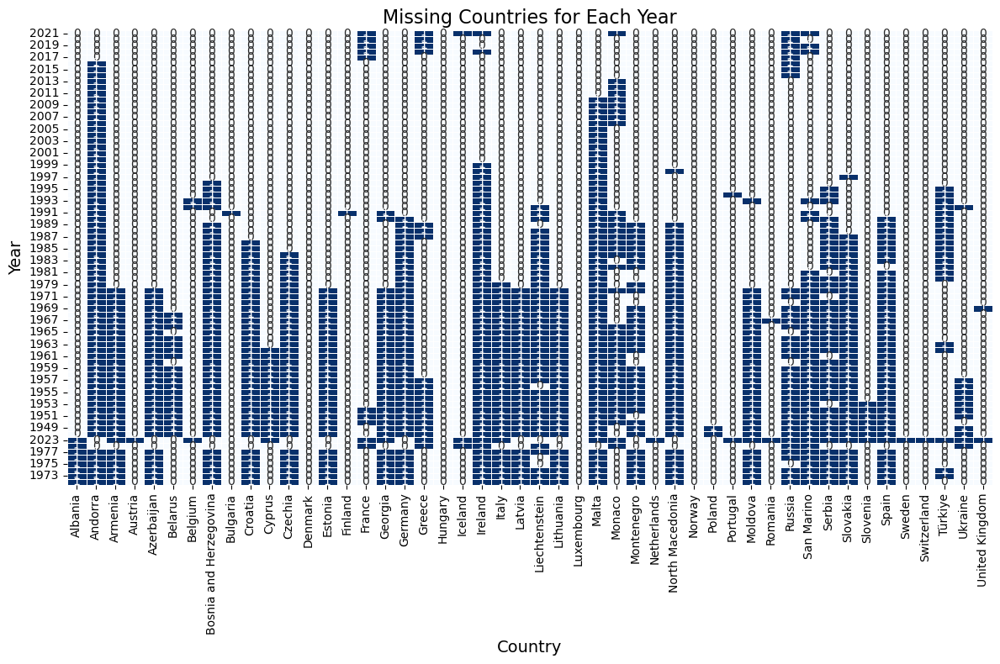

In [27]:
all_countries = df['Country'].unique()

# Create an empty DataFrame with years as rows and countries as columns
missing_df = pd.DataFrame(index=df['Year'].unique(), columns=all_countries)

# Fill the DataFrame with 'X' to indicate missing data
for year in df['Year'].unique():
    countries_in_year = df[df['Year'] == year]['Country'].unique()
    missing_countries = set(all_countries) - set(countries_in_year)
    
    # Mark missing countries with 'X' for each year
    missing_df.loc[year, list(missing_countries)] = 'X'

# Fill any NaN values with an empty string (i.e., countries that have data for the year)
missing_df = missing_df.fillna('')

# Visualize the missing data using a heatmap
plt.figure(figsize=(12, 8))  # Set the figure size
sns.heatmap(missing_df == 'X', annot=True, cmap='Blues', cbar=False, linewidths=0.5)

# Customize the plot
plt.title('Missing Countries for Each Year', fontsize=16)
plt.xlabel('Country', fontsize=14)
plt.ylabel('Year', fontsize=14)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent clipping

# Show the plot
plt.show()

We noticed that some countries have a lot of data missing so we decided to remove them from the dataset to make our data more concise
- We removed Malta also because divorce was only legalised in 2011 so the data is very limited for this country

In [29]:
# List of countries to drop
countries_to_remove = ["Andorra", "Malta", "Monaco", "Russia","Montenegro","San Marino"]

# Filter out rows where the Country column matches any country in the list
df = df[~df["Country"].isin(countries_to_remove)]


We can now check what the missing data looks like after removing selected countries

<Figure size 1200x800 with 0 Axes>

<Axes: >

Text(0.5, 1.0, 'Missing Countries for Each Year')

Text(0.5, 58.7222222222222, 'Country')

Text(120.72222222222221, 0.5, 'Year')

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5,
        22.5, 23.5, 24.5, 25.5, 26.5, 27.5, 28.5, 29.5, 30.5, 31.5, 32.5,
        33.5, 34.5, 35.5, 36.5, 37.5, 38.5, 39.5, 40.5, 41.5]),
 [Text(0.5, 0, 'Albania'),
  Text(1.5, 0, 'Armenia'),
  Text(2.5, 0, 'Austria'),
  Text(3.5, 0, 'Azerbaijan'),
  Text(4.5, 0, 'Belarus'),
  Text(5.5, 0, 'Belgium'),
  Text(6.5, 0, 'Bosnia and Herzegovina'),
  Text(7.5, 0, 'Bulgaria'),
  Text(8.5, 0, 'Croatia'),
  Text(9.5, 0, 'Cyprus'),
  Text(10.5, 0, 'Czechia'),
  Text(11.5, 0, 'Denmark'),
  Text(12.5, 0, 'Estonia'),
  Text(13.5, 0, 'Finland'),
  Text(14.5, 0, 'France'),
  Text(15.5, 0, 'Georgia'),
  Text(16.5, 0, 'Germany'),
  Text(17.5, 0, 'Greece'),
  Text(18.5, 0, 'Hungary'),
  Text(19.5, 0, 'Iceland'),
  Text(20.5, 0, 'Ireland'),
  Text(21.5, 0, 'Italy'),
  Text(22.5, 0, 'Latvia'),
  Text(23.5, 0, 'Liechtenstein'),
  Text(24.5, 0, 'Lithuania'),
  T

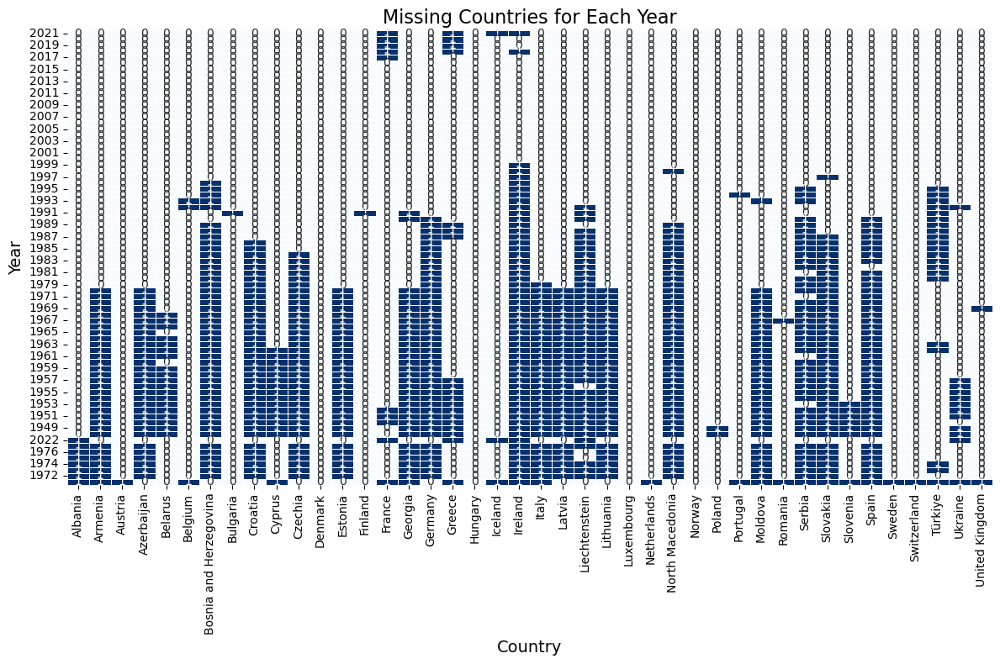

In [31]:
all_countries = df['Country'].unique()

# Create an empty DataFrame with years as rows and countries as columns
missing_df = pd.DataFrame(index=df['Year'].unique(), columns=all_countries)

# Fill the DataFrame with 'X' to indicate missing data
for year in df['Year'].unique():
    countries_in_year = df[df['Year'] == year]['Country'].unique()
    missing_countries = set(all_countries) - set(countries_in_year)
    
    # Mark missing countries with 'X' for each year
    missing_df.loc[year, list(missing_countries)] = 'X'

# Fill any NaN values with an empty string (i.e., countries that have data for the year)
missing_df = missing_df.fillna('')

# Visualize the missing data using a heatmap
plt.figure(figsize=(12, 8))  # Set the figure size
sns.heatmap(missing_df == 'X', annot=True, cmap='Blues', cbar=False, linewidths=0.5)

# Customize the plot
plt.title('Missing Countries for Each Year', fontsize=16)
plt.xlabel('Country', fontsize=14)
plt.ylabel('Year', fontsize=14)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent clipping

# Show the plot
plt.show()

Now we have a better selection of countries and can pick visualisations apt to the data we have available

In [33]:
df.head()

,Country,Year,Area,Divorces
0,Albania,2021,Total,3113.0
1,Albania,2020,Total,4267.0
2,Albania,2019,Total,5860.0
3,Albania,2018,Total,4846.0
4,Albania,2017,Total,4508.0


In [45]:
# Add Divorce-to-Marriage Ratio column to the dataset
df["Divorce_to_Marriage_Ratio"] = df["Divorces"] / df["Marriages"]

# Define a simple regional map for groupings
region_map = {
    "Northern Europe": ["Denmark", "Estonia", "Finland", "Iceland", "Ireland", "Latvia", "Lithuania", "Norway", "Sweden", "United Kingdom"],
    "Southern Europe": ["Albania", "Bosnia and Herzegovina", "Croatia", "Cyprus", "Greece", "Italy", "North Macedonia", "Portugal", "Serbia", "Slovenia", "Spain", "Türkiye"],
    "Western Europe": ["Austria", "Belgium", "France", "Germany", "Liechtenstein", "Luxembourg", "Netherlands", "Switzerland"],
    "Eastern Europe": ["Armenia", "Azerbaijan", "Belarus", "Bulgaria", "Czechia", "Georgia", "Hungary", "Moldova", "Poland", "Romania", "Slovakia", "Ukraine"]
}

# Create a reverse mapping to assign each country a region
country_to_region = {}
for region, countries in region_map.items():
    for country in countries:
        country_to_region[country] = region

# Assign the region to each row in the dataset
df["Region"] = df["Country"].map(country_to_region)




## Exploring the dataset <a class="anchor" id="data-exploring"></a>

#### Plotting Line Chart for a single country

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='Year', ylabel='Divorces'>

Text(0.5, 1.0, 'Total Divorces in Switzerland')

Text(0.5, 0, 'Year')

Text(0, 0.5, 'Number of Divorces')

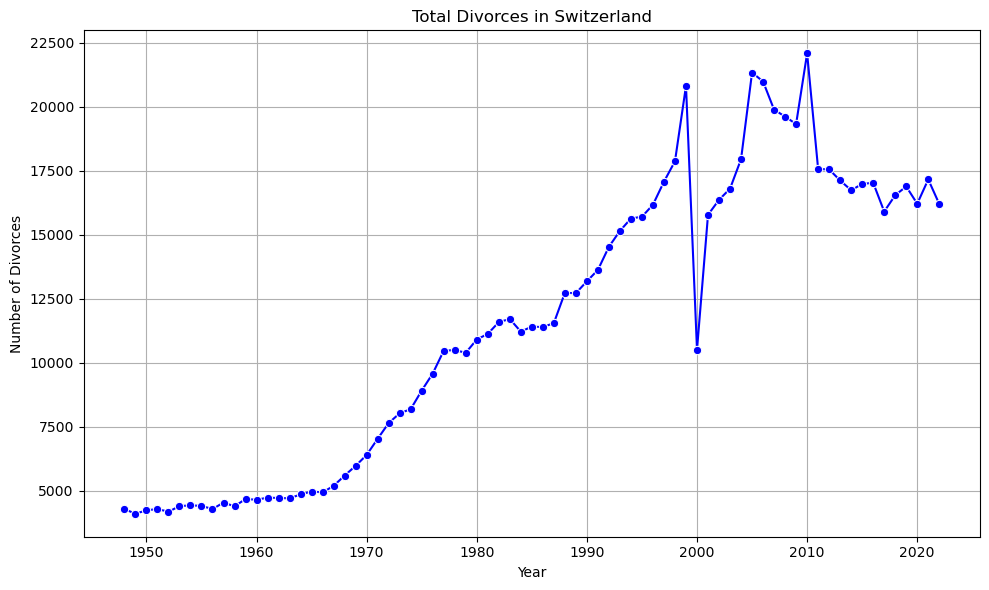

In [35]:
country_name = 'Switzerland'
filtered_country = df[(df['Country'] == country_name) & (df['Area'] == 'Total')]

# Plotting for one country
plt.figure(figsize=(10, 6))
sns.lineplot(data=filtered_country, x='Year', y='Divorces', marker='o', color='blue')

# Customize the plot
plt.title(f'Total Divorces in {country_name}')
plt.xlabel('Year')
plt.ylabel('Number of Divorces')
plt.grid(True)
plt.tight_layout()
plt.savefig("Switzerland Divorces.png")
# Show the plot
plt.show()


#### Plotting Line Charts for all the countries 

<Figure size 1200x800 with 0 Axes>

<Axes: xlabel='Year', ylabel='Divorces'>

<Axes: xlabel='Year', ylabel='Divorces'>

<Axes: xlabel='Year', ylabel='Divorces'>

<Axes: xlabel='Year', ylabel='Divorces'>

Text(0.5, 1.0, 'Total Divorces for Selected Countries')

Text(0.5, 0, 'Year')

Text(0, 0.5, 'Number of Divorces')

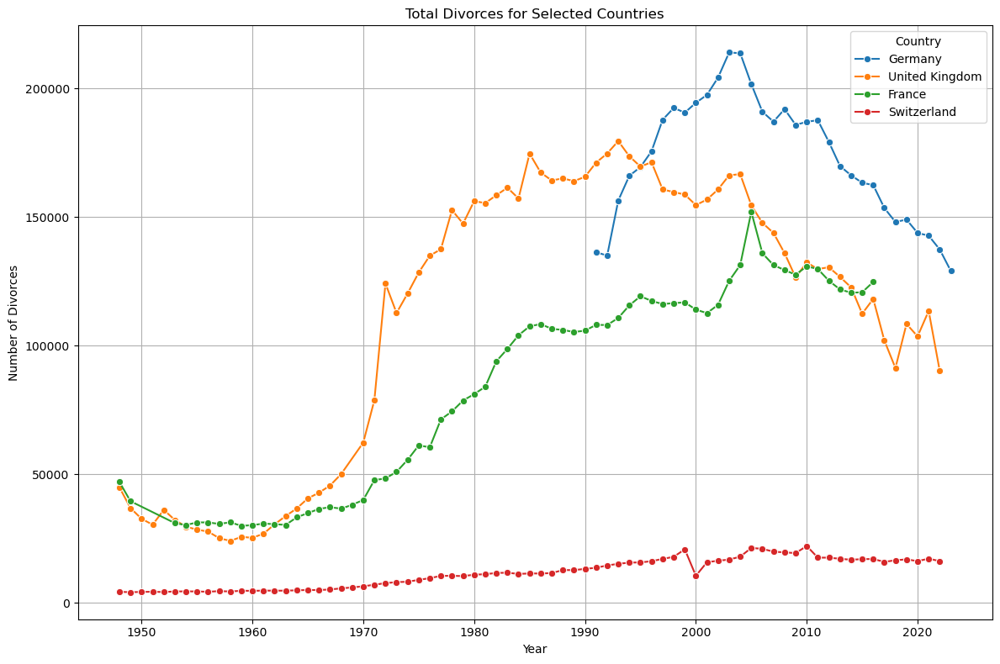

In [37]:
countries=['Germany', 'United Kingdom', 'France','Switzerland']
plt.figure(figsize=(12, 8))

for country_name in countries:
    filtered_country = df[(df['Country'] == country_name) & (df['Area'] == 'Total')]
    sns.lineplot(data=filtered_country, x='Year', y='Divorces', marker='o', label=country_name)

# Customize the plot
plt.title('Total Divorces for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Number of Divorces')
plt.legend(title='Country')
plt.grid(True)
plt.tight_layout()

# Show the combined plot
plt.show()

## Merging other datasets

#### Merging Population data

##### We need to find data on the population of each country and calculate the divorces per 1000 people

In [39]:
pop = pd.read_csv("Europe Population.csv")
pd.options.display.max_columns = None

In [41]:
pop.head()
pop.info()
pop['Time'].isna()
pop.tail()
pop = pop.dropna(subset=['Time'])
pop.tail()

,Country Name,Country Code,Time,Time Code,"Population, total [SP.POP.TOTL]"
0,Albania,ALB,1960.0,YR1960,1608800.0
1,Albania,ALB,1961.0,YR1961,1659800.0
2,Albania,ALB,1962.0,YR1962,1711319.0
3,Albania,ALB,1963.0,YR1963,1762621.0
4,Albania,ALB,1964.0,YR1964,1814135.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2693 entries, 0 to 2692
Data columns (total 5 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country Name                     2690 non-null   object 
 1   Country Code                     2688 non-null   object 
 2   Time                             2688 non-null   float64
 3   Time Code                        2688 non-null   object 
 4   Population, total [SP.POP.TOTL]  2688 non-null   float64
dtypes: float64(2), object(3)
memory usage: 105.3+ KB


0       False
1       False
2       False
3       False
4       False
        ...  
2688     True
2689     True
2690     True
2691     True
2692     True
Name: Time, Length: 2693, dtype: bool

,Country Name,Country Code,Time,Time Code,"Population, total [SP.POP.TOTL]"
2688,NaN,NaN,NaN,NaN,NaN
2689,NaN,NaN,NaN,NaN,NaN
2690,NaN,NaN,NaN,NaN,NaN
2691,Data from database: World Development Indicators,NaN,NaN,NaN,NaN
2692,Last Updated: 01/28/2025,NaN,NaN,NaN,NaN


,Country Name,Country Code,Time,Time Code,"Population, total [SP.POP.TOTL]"
2683,United Kingdom,GBR,2019.0,YR2019,66836327.0
2684,United Kingdom,GBR,2020.0,YR2020,67081234.0
2685,United Kingdom,GBR,2021.0,YR2021,67026292.0
2686,United Kingdom,GBR,2022.0,YR2022,67791000.0
2687,United Kingdom,GBR,2023.0,YR2023,68350000.0


In [43]:
# Remove specific columns
columns_to_remove = ["Time Code", "Country Code"]  # List of columns to remove
pop = pop.drop(columns=columns_to_remove)

# Rename 'Value' column to 'Population'
pop = pop.rename(columns={"Population, total [SP.POP.TOTL]": "Population","Country Name":"Country","Time":"Year"})

# Change Year to integer
pop['Year'] = pop['Year'].astype(int)
pop['Country'] = cc.convert(names = pop['Country'], to = 'name_short') 
# Display the resulting DataFrame
pop.tail()

,Country,Year,Population
2683,United Kingdom,2019,66836327.0
2684,United Kingdom,2020,67081234.0
2685,United Kingdom,2021,67026292.0
2686,United Kingdom,2022,67791000.0
2687,United Kingdom,2023,68350000.0


In [45]:
df_original = pd.DataFrame(df)
df_population = pd.DataFrame(pop)

# Merge the two datasets on 'Country' and 'Year'
df_merged = pd.merge(df_original, df_population, on=['Country', 'Year'], how='left')

# Display the merged DataFrame
df_merged.head()

,Country,Year,Area,Divorces,Population
0,Albania,2021,Total,3113.0,2811666.0
1,Albania,2020,Total,4267.0,2837849.0
2,Albania,2019,Total,5860.0,2854191.0
3,Albania,2018,Total,4846.0,2866376.0
4,Albania,2017,Total,4508.0,2873457.0


#### Merging GDP data

In [49]:
gdp = pd.read_excel('Europe GDP per capita.xlsx') 
gdp.head()


,Country,Year,GDP
0,Albania,2022,6655.26
1,Albania,2021,6281.05
2,Albania,2020,5288.99
3,Albania,2019,5359.24
4,Albania,2018,5268.12


In [53]:
# Merge the two datasets on 'Country' and 'Year'
merged = pd.merge(df_merged, gdp, on=['Country', 'Year'], how='left')

# Display the merged DataFrame
merged.head()


,Country,Year,Area,Divorces,Population,GDP
0,Albania,2021,Total,3113.0,2811666.0,6281.05
1,Albania,2020,Total,4267.0,2837849.0,5288.99
2,Albania,2019,Total,5860.0,2854191.0,5359.24
3,Albania,2018,Total,4846.0,2866376.0,5268.12
4,Albania,2017,Total,4508.0,2873457.0,4521.75


#### Creating Divorces Per 1000 Variable

In [55]:
merged['Divorce Rate'] = merged.apply(lambda row: (row['Divorces'] / row['Population']) * 100000 
                              if row['Area'] == 'Total' else None, axis=1)
merged.head()

,Country,Year,Area,Divorces,Population,GDP,Divorce Rate
0,Albania,2021,Total,3113.0,2811666.0,6281.05,110.717276
1,Albania,2020,Total,4267.0,2837849.0,5288.99,150.360361
2,Albania,2019,Total,5860.0,2854191.0,5359.24,205.312118
3,Albania,2018,Total,4846.0,2866376.0,5268.12,169.063654
4,Albania,2017,Total,4508.0,2873457.0,4521.75,156.884199


#### Merging Longitute and Latitude Values for each country

In [57]:
country_coords = pd.read_csv("Country Coords.csv") 
country_coords.rename(columns={"country": "Country"}, inplace=True)
country_coords['Country'] = cc.convert(names = country_coords['Country'], to = 'name_short') 
country_coords.head()
merged = merged.merge(country_coords, on="Country", how="left")
merged.head()

Netherlands Antilles not found in regex
Congo [Republic] not found in regex


,latitude,longitude,Country
0,42.546245,1.601554,Andorra
1,23.424076,53.847818,United Arab Emirates
2,33.939110,67.709953,Afghanistan
3,17.060816,-61.796428,Antigua and Barbuda
4,18.220554,-63.068615,Anguilla


,Country,Year,Area,Divorces,Population,GDP,Divorce Rate,latitude,longitude
0,Albania,2021,Total,3113.0,2811666.0,6281.05,110.717276,41.153332,20.168331
1,Albania,2020,Total,4267.0,2837849.0,5288.99,150.360361,41.153332,20.168331
2,Albania,2019,Total,5860.0,2854191.0,5359.24,205.312118,41.153332,20.168331
3,Albania,2018,Total,4846.0,2866376.0,5268.12,169.063654,41.153332,20.168331
4,Albania,2017,Total,4508.0,2873457.0,4521.75,156.884199,41.153332,20.168331


In [59]:
merged.rename(columns={'latitude': 'Latitude', 'longitude': 'Longitude','GDP':'GDP Per Capita'}, inplace=True)
merged.head()

,Country,Year,Area,Divorces,Population,GDP Per Capita,Divorce Rate,Latitude,Longitude
0,Albania,2021,Total,3113.0,2811666.0,6281.05,110.717276,41.153332,20.168331
1,Albania,2020,Total,4267.0,2837849.0,5288.99,150.360361,41.153332,20.168331
2,Albania,2019,Total,5860.0,2854191.0,5359.24,205.312118,41.153332,20.168331
3,Albania,2018,Total,4846.0,2866376.0,5268.12,169.063654,41.153332,20.168331
4,Albania,2017,Total,4508.0,2873457.0,4521.75,156.884199,41.153332,20.168331


#### Merging Urbanisation Rate

In [77]:
# Load urbanisation rate dataset
urban_df = pd.read_csv('Europe Urbanisation Rate.csv') 

# Merge the datasets on country and year
merged_df = pd.merge(merged, urban_df, on=['Country', 'Year'], how='left')
merged_df.head()

,Country,Year,Area,Divorces,Population,GDP Per Capita,Divorce Rate,Latitude,Longitude,Urbanization Rate
0,Albania,2021,Total,3113.0,2811666.0,6281.05,110.717276,41.153332,20.168331,0.6297
1,Albania,2020,Total,4267.0,2837849.0,5288.99,150.360361,41.153332,20.168331,0.6211
2,Albania,2019,Total,5860.0,2854191.0,5359.24,205.312118,41.153332,20.168331,0.6123
3,Albania,2018,Total,4846.0,2866376.0,5268.12,169.063654,41.153332,20.168331,0.6032
4,Albania,2017,Total,4508.0,2873457.0,4521.75,156.884199,41.153332,20.168331,0.5938


In [79]:
merged_df.rename(columns={'Urbanization Rate': 'Urbanisation Rate'}, inplace=True)
merged_df.head()

,Country,Year,Area,Divorces,Population,GDP Per Capita,Divorce Rate,Latitude,Longitude,Urbanisation Rate
0,Albania,2021,Total,3113.0,2811666.0,6281.05,110.717276,41.153332,20.168331,0.6297
1,Albania,2020,Total,4267.0,2837849.0,5288.99,150.360361,41.153332,20.168331,0.6211
2,Albania,2019,Total,5860.0,2854191.0,5359.24,205.312118,41.153332,20.168331,0.6123
3,Albania,2018,Total,4846.0,2866376.0,5268.12,169.063654,41.153332,20.168331,0.6032
4,Albania,2017,Total,4508.0,2873457.0,4521.75,156.884199,41.153332,20.168331,0.5938


### Saving final dataset

In [81]:
merged_df.to_csv('Europe_divorce_pop_gdp_coord_urban.csv', index=False)

### Reading the Cleaned Dataset

In [95]:
# To display full output in Notebook, instead of only the last result
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "last_expr"

In [4]:
df = pd.read_csv("Europe_divorce_pop_gdp_coord_urban.csv")
df.head()

,Country,Year,Area,Divorces,Population,GDP Per Capita,Divorce Rate,Latitude,Longitude,Urbanisation Rate
0,Albania,2021,Total,3113.0,2811666.0,6281.05,110.717276,41.153332,20.168331,0.6297
1,Albania,2020,Total,4267.0,2837849.0,5288.99,150.360361,41.153332,20.168331,0.6211
2,Albania,2019,Total,5860.0,2854191.0,5359.24,205.312118,41.153332,20.168331,0.6123
3,Albania,2018,Total,4846.0,2866376.0,5268.12,169.063654,41.153332,20.168331,0.6032
4,Albania,2017,Total,4508.0,2873457.0,4521.75,156.884199,41.153332,20.168331,0.5938


In [6]:
df.info()
print(df["Country"].unique())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9697 entries, 0 to 9696
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Country            9697 non-null   object 
 1   Year               9697 non-null   int64  
 2   Area               9697 non-null   object 
 3   Divorces           9697 non-null   float64
 4   Population         9461 non-null   float64
 5   GDP Per Capita     7694 non-null   float64
 6   Divorce Rate       3959 non-null   float64
 7   Latitude           9697 non-null   float64
 8   Longitude          9697 non-null   float64
 9   Urbanisation Rate  9080 non-null   float64
dtypes: float64(7), int64(1), object(2)
memory usage: 757.7+ KB
['Albania' 'Armenia' 'Austria' 'Azerbaijan' 'Belarus' 'Belgium'
 'Bosnia and Herzegovina' 'Bulgaria' 'Croatia' 'Cyprus' 'Czechia'
 'Denmark' 'Estonia' 'Finland' 'France' 'Georgia' 'Germany' 'Greece'
 'Hungary' 'Iceland' 'Ireland' 'Italy' 'Latvia' 'Liech

In [8]:
def recalculate_divorce_rate(row):
    if row['Area'] == "Total":  # Skip rows where Area is "Total"
        return row['Divorce Rate']

    if row['Area'] == "Urban":
        urban_population = row['Population'] * row['Urbanisation Rate']
        if urban_population > 0:
            return (row['Divorces'] / urban_population) * 100000

    if row['Area'] == "Rural":
        rural_population = row['Population'] * (1 - row['Urbanisation Rate'])
        if rural_population > 0:
            return (row['Divorces'] / rural_population) * 100000

    return row['Divorce Rate']  # Keep existing value if conditions are not met

# Apply function to recalculate divorce rate
df['Divorce Rate'] = df.apply(recalculate_divorce_rate, axis=1)

df = df.drop_duplicates()

# Print updated dataset
df.info()


<class 'pandas.core.frame.DataFrame'>
Index: 4195 entries, 0 to 9696
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Country            4195 non-null   object 
 1   Year               4195 non-null   int64  
 2   Area               4195 non-null   object 
 3   Divorces           4195 non-null   float64
 4   Population         3959 non-null   float64
 5   GDP Per Capita     3074 non-null   float64
 6   Divorce Rate       3875 non-null   float64
 7   Latitude           4195 non-null   float64
 8   Longitude          4195 non-null   float64
 9   Urbanisation Rate  3806 non-null   float64
dtypes: float64(7), int64(1), object(2)
memory usage: 360.5+ KB


## Presenting the Data <a class="anchor" id="data-presenting"></a>

### **A selection of static charts** <a class="anchor" id="static-charts">

#### 1. Divorce Rate Trends (France vs Germany vs UK)

<Figure size 1200x600 with 0 Axes>

<Axes: xlabel='Year', ylabel='Divorce Rate'>

Text(0.5, 1.0, 'Divorce Rate Trends: France vs. Germany vs. UK')

Text(0.5, 0, 'Year')

Text(0, 0.5, 'Divorces per 100,000')

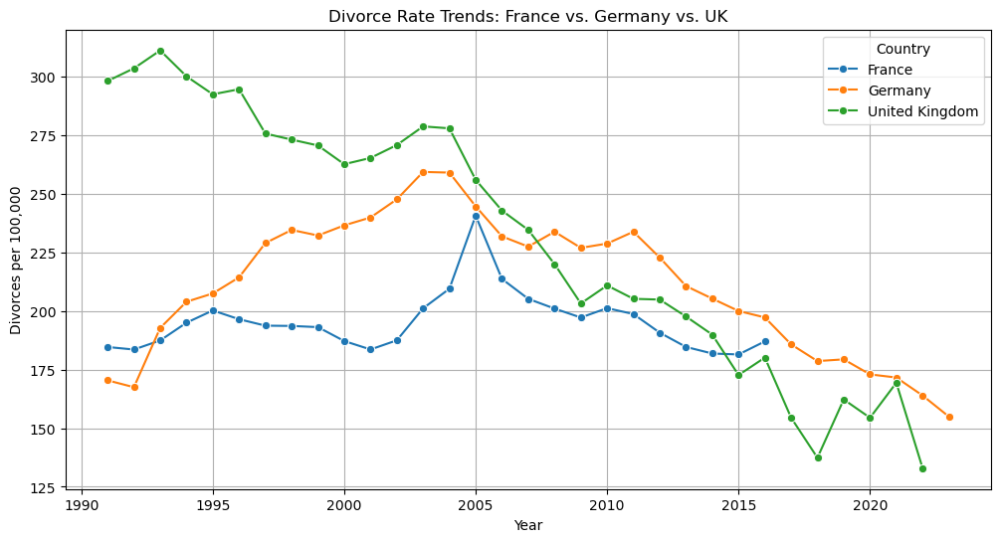

['Albania' 'Armenia' 'Austria' 'Azerbaijan' 'Belarus' 'Belgium'
 'Bosnia and Herzegovina' 'Bulgaria' 'Croatia' 'Cyprus' 'Czechia'
 'Denmark' 'Estonia' 'Finland' 'France' 'Georgia' 'Germany' 'Greece'
 'Hungary' 'Iceland' 'Ireland' 'Italy' 'Latvia' 'Liechtenstein'
 'Lithuania' 'Luxembourg' 'Netherlands' 'North Macedonia' 'Norway'
 'Poland' 'Portugal' 'Moldova' 'Romania' 'Serbia' 'Slovakia' 'Slovenia'
 'Spain' 'Sweden' 'Switzerland' 'Türkiye' 'Ukraine' 'United Kingdom']


In [67]:
import seaborn as sns
import matplotlib.pyplot as plt


selected_countries = ["France", "Germany", "United Kingdom"]
df_selected_countries = df[df["Country"].isin(selected_countries)]
df_total_only = df_selected_countries[df_selected_countries["Area"] == "Total"]
earliest_years_per_country = df_total_only.groupby("Country")["Year"].min()
common_start_year = earliest_years_per_country.max()
df_filtered = df_total_only[df_total_only["Year"] >= common_start_year]
df_filtered = df_filtered.reset_index(drop=True)
plt.figure(figsize=(12, 6))
sns.lineplot(x="Year", y="Divorce Rate", hue="Country", data=df_filtered, marker="o")
plt.title("Divorce Rate Trends: France vs. Germany vs. UK")
plt.xlabel("Year")
plt.ylabel("Divorces per 100,000")
plt.legend(title="Country")
plt.grid(True)
plt.show()
print(df["Country"].unique())


#### 2. Global Divorce Rate Over Time compared to Global GDP

<Axes: xlabel='Year', ylabel='Divorce Rate'>

Text(0, 0.5, 'Divorce Rate (per 100,000 people)')

Text(0.5, 1.0, 'Global Divorce Rate Over Time')

<Axes: xlabel='Year', ylabel='GDP Per Capita'>

Text(0, 0.5, 'GDP Per Capita (USD)')

Text(0.5, 1.0, 'Global GDP Per Capita Over Time')

Text(0.5, 0, 'Year')

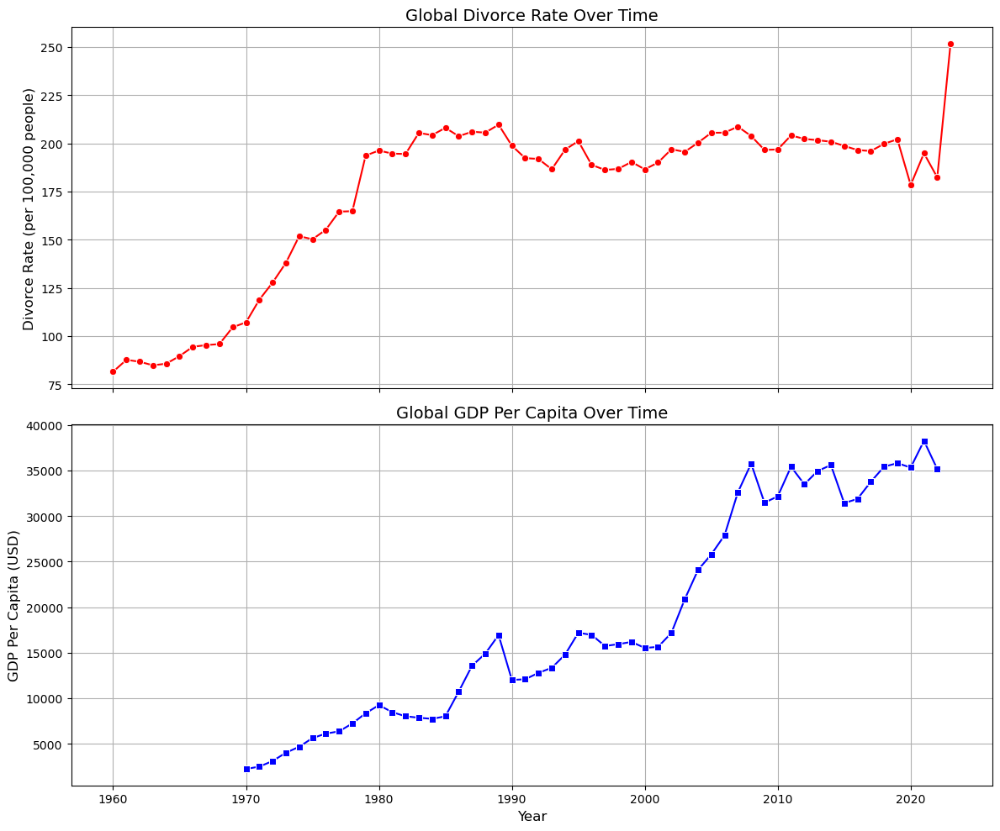

In [72]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter the DataFrame to keep only rows where Area = "Total"
df_filtered = df[df["Area"] == "Total"]

# Aggregate GDP and Divorce Rate over time
df_total = df_filtered.groupby("Year").agg({"GDP Per Capita": "mean", "Divorce Rate": "mean"}).reset_index()

# Create separate line charts
fig, axes = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

# Divorce Rate over time
sns.lineplot(ax=axes[0], x=df_total["Year"], y=df_total["Divorce Rate"], marker="o", color="red")
axes[0].set_ylabel("Divorce Rate (per 100,000 people)", fontsize=12)
axes[0].set_title("Global Divorce Rate Over Time", fontsize=14)
axes[0].grid(True)

# GDP over time
sns.lineplot(ax=axes[1], x=df_total["Year"], y=df_total["GDP Per Capita"], marker="s", color="blue")
axes[1].set_ylabel("GDP Per Capita (USD)", fontsize=12)
axes[1].set_title("Global GDP Per Capita Over Time", fontsize=14)
axes[1].grid(True)

plt.xlabel("Year", fontsize=12)
plt.tight_layout()
plt.show()


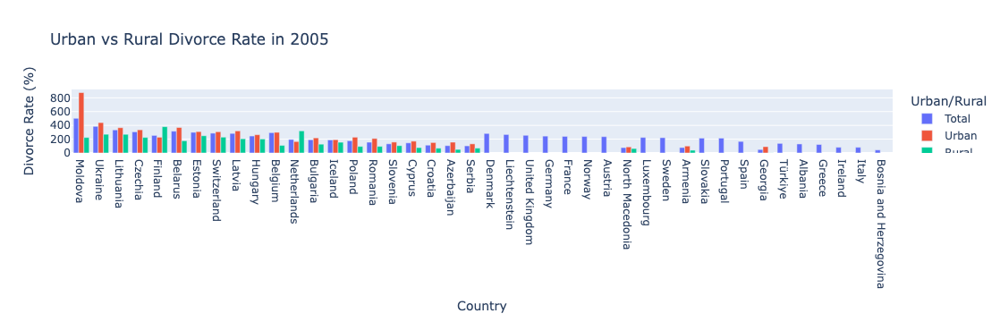

In [10]:
# 11. Urban vs Rural Divorce Rate by Country (1998)
# Choose a specific year (e.g., 1998)
selected_year = 2005
df_year = df[df["Year"] == selected_year]

# Create grouped bar chart
fig11 = px.bar(df_year, x="Country", y="Divorce Rate", color="Area", 
              barmode="group", title=f"Urban vs Rural Divorce Rate in {selected_year}",
              labels={"Divorce Rate": "Divorce Rate (%)", "Area": "Urban/Rural"},
              height=600)

# Improve readability
fig11.update_layout(xaxis={'categoryorder':'total descending'})

#### Urban vs Rural Divorce Rate Over Time 

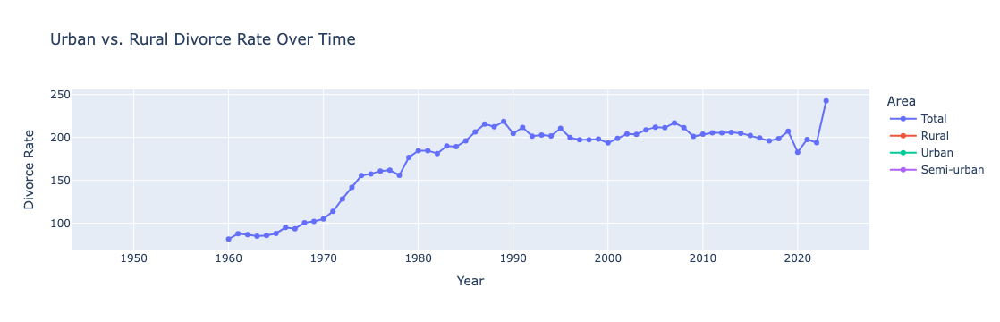

In [22]:
df_avg_time = df.groupby(["Year", "Area"], as_index=False)["Divorce Rate"].mean()

# Create line chart
fig12 = px.line(df_avg_time, x="Year", y="Divorce Rate", color="Area",
               title="Urban vs. Rural Divorce Rate Over Time",
               markers=True)
fig12.show()

### **Dynamic Charts**

#### 1. Regression for GDP Capita and Divorce Rate

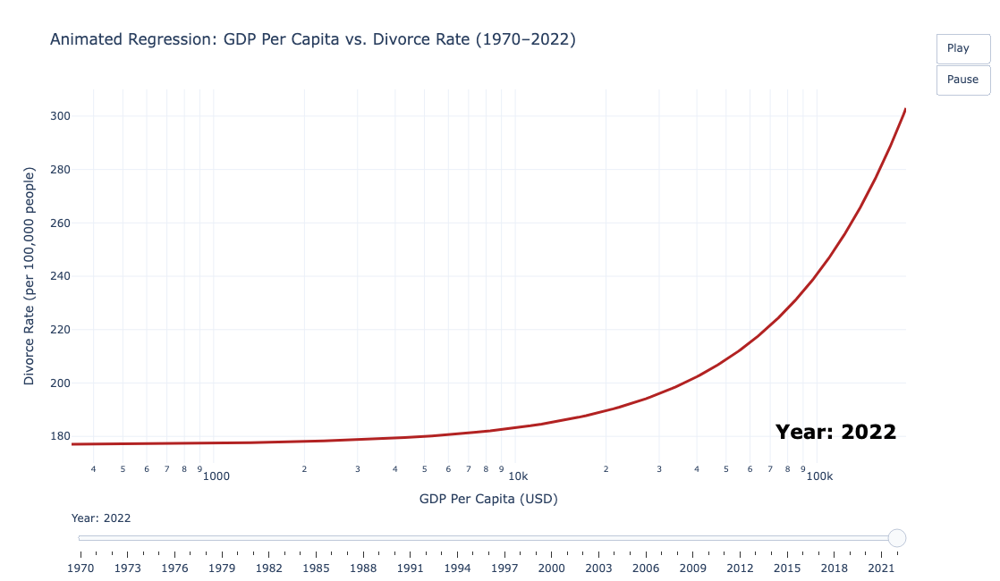

In [166]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from statsmodels.api import OLS, add_constant

# Load your dataset
df = pd.read_csv("Merged_Data_Divorce.csv")

# Clean the data
df_clean = df.dropna(subset=["GDP Per Capita", "Divorce Rate", "Year"])
df_clean = df_clean[df_clean["GDP Per Capita"] > 0]
df_clean["Year"] = df_clean["Year"].astype(int)

# Animation setup
years = sorted(df_clean["Year"].unique())
gdp_range = np.linspace(df_clean["GDP Per Capita"].min(), df_clean["GDP Per Capita"].max(), 200)

# Create animation frames
frames = []
for year in years:
    sub_data = df_clean[df_clean["Year"] <= year]
    X = add_constant(sub_data["GDP Per Capita"])
    y = sub_data["Divorce Rate"]
    model = OLS(y, X).fit()
    y_pred = model.predict(add_constant(gdp_range))

    frames.append(go.Frame(
        data=[

            go.Scatter(
                x=gdp_range,
                y=y_pred,
                mode='lines',
                line=dict(color='firebrick', width=3),
                name='Regression Line'
            )
        ],
        name=str(year),
        layout=go.Layout(annotations=[
            dict(
                x=0.99, y=0.05, xref="paper", yref="paper",
                text=f"<b>Year: {year}</b>",
                showarrow=False, font=dict(size=22, color="black"),
                align="right"
            )
        ])
    ))

# Initial frame
initial_data = df_clean[df_clean["Year"] <= years[0]]
X0 = add_constant(initial_data["GDP Per Capita"])
model0 = OLS(initial_data["Divorce Rate"], X0).fit()
y_pred0 = model0.predict(add_constant(gdp_range))

# Create figure
fig = go.Figure(
    data=[
        go.Scatter(
            x=gdp_range,
            y=y_pred0,
            mode='lines',
            line=dict(color='firebrick', width=3),
            name='Regression Line'
        )
    ],
    layout=go.Layout(
        title="Animated Regression: GDP Per Capita vs. Divorce Rate (1970–2022)",
        xaxis=dict(title="GDP Per Capita (USD)", type="log"),
        yaxis=dict(title="Divorce Rate (per 100,000 people)"),
        updatemenus=[dict(
            type="buttons",
            showactive=False,
            buttons=[
                dict(label="Play", method="animate", args=[None, {"frame": {"duration": 300}, "fromcurrent": True}]),
                dict(label="Pause", method="animate", args=[[None], {"frame": {"duration": 0}, "mode": "immediate"}])
            ],
            x=1.1, y=1.15
        )],
        sliders=[{
            "active": 0,
            "currentvalue": {"prefix": "Year: "},
            "pad": {"t": 50},
            "steps": [{
                "args": [[str(year)], {"frame": {"duration": 0}, "mode": "immediate"}],
                "label": str(year),
                "method": "animate"
            } for year in years]
        }],
        height=650,
        width=950,
        template="plotly_white"
    ),
    frames=frames
)

fig.show()


### 2. Map of Global Divorces Per 100,000 over time

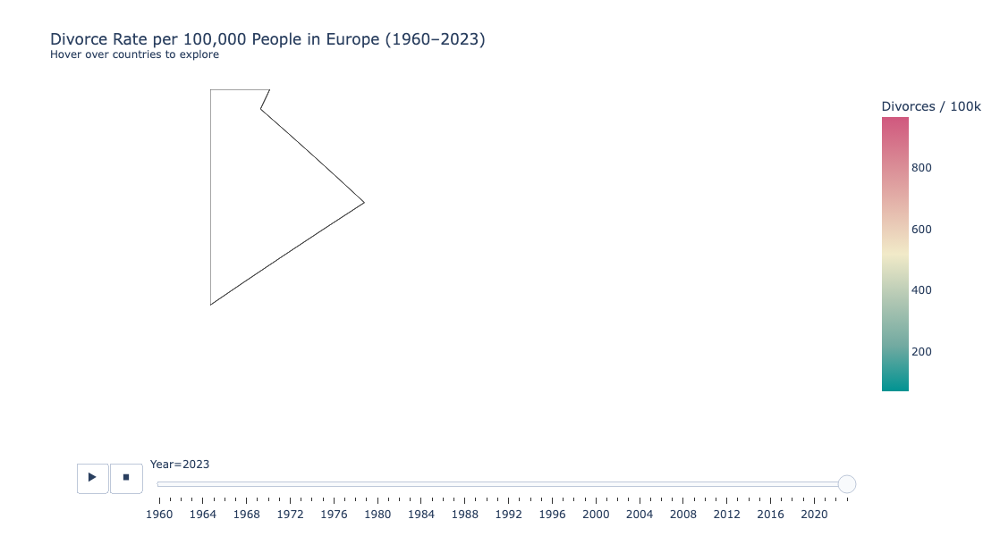

In [52]:
import plotly.express as px

# Filter for Total area and clean missing values
div_map_df = df[df["Area"] == "Total"].dropna(subset=["Divorce Rate"])
div_map_df = div_map_df.sort_values("Year")

# Create animated choropleth
fig = px.choropleth(
    div_map_df,
    locations="Country",
    locationmode="country names",
    color="Divorce Rate",
    hover_name="Country",
    hover_data={
        "Divorces": True,
        "Population": True,
        "Divorce Rate": ':.2f',
        "GDP Per Capita": True
    },
    animation_frame="Year",
    title="Divorce Rate per 100,000 People in Europe (1960–2023)<br><sup>Hover over countries to explore</sup>",
    color_continuous_scale="Tealrose",
    labels={"Divorce Rate": "Divorces per 100,000"},
)

# Zoom into Europe + adjust map styling
fig.update_geos(
    scope="europe",  # ✅ Zoom to Europe
    projection_type="natural earth",
    showcoastlines=True,
    showland=True,
    landcolor="white",
    lataxis_range=[35, 72],
    lonaxis_range=[-25, 45],
    fitbounds="locations"
)

# Layout adjustments
fig.update_layout(
    template="plotly_white",
    width=1000,
    height=600,
    coloraxis_colorbar=dict(title="Divorces / 100k")
)

fig.show()





### **Some Plotly charts** <a class="anchor" id="plotly-charts"></a>

#### 1. Showing the Divorce rate for countries in Europe in 2017

C:\Users\dilan\AppData\Local\Temp\ipykernel_15756\2709482507.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



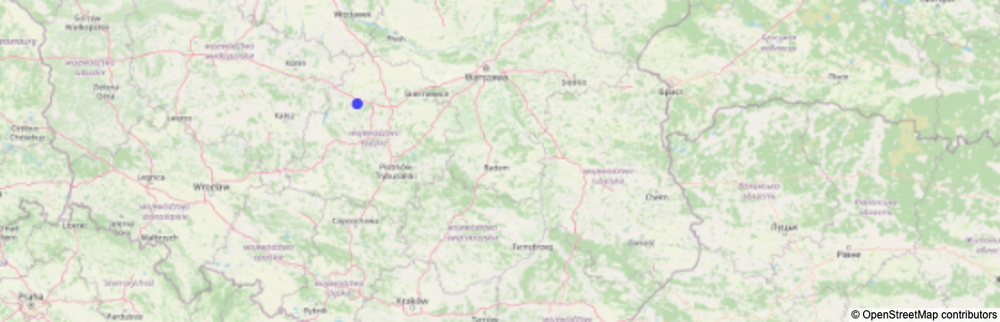

In [40]:
# Filter dataset for Year = 2017 and Area = "Total"
df_filtered = df[(df['Year'] == 2017) & (df['Area'] == "Total")]

# Function to scale marker sizes based on divorce rate
def calc_marker_radius(rate, scale_factor=70):
    return (rate ** 2) * scale_factor  # Squaring to enhance differences
    
df_filtered["Marker Size"] = df_filtered["Divorce Rate"].apply(calc_marker_radius)

# Create Scatter Mapbox
fig = px.scatter_mapbox(df_filtered, 
                        lat="latitude", lon="longitude", 
                        hover_name="Country", 
                        hover_data=["Divorce Rate"], 
                        color_discrete_sequence=["blue"],  # Marker color
                        zoom=1,  # Adjust zoom level
                        size="Marker Size")  # Marker size based on divorce rate

# Use OpenStreetMap as the map style
fig.update_layout(mapbox_style="open-street-map")

# Remove extra margins
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

# Show the interactive map
fig.show()


In [151]:
# Getting an embedded string
embed_string = plot(fig, output_type='div', include_plotlyjs="cdn")
print(embed_string)

<div>                        <script type="text/javascript">window.PlotlyConfig = {MathJaxConfig: 'local'};</script>
        <script charset="utf-8" src="https://cdn.plot.ly/plotly-2.32.0.min.js"></script>                <div id="5d1f27d0-90eb-43f5-81f4-bfee95a32268" class="plotly-graph-div" style="height:100%; width:100%;"></div>            <script type="text/javascript">                                    window.PLOTLYENV=window.PLOTLYENV || {};                                    if (document.getElementById("5d1f27d0-90eb-43f5-81f4-bfee95a32268")) {                    Plotly.newPlot(                        "5d1f27d0-90eb-43f5-81f4-bfee95a32268",                        [{"customdata":[[156.88419906753433],[132.24139088407065],[183.9145054438921],[147.28994717188385],[338.36597124703286],[202.7927875815],[88.13882418958656],[147.13224957733573],[155.02026893109257],[154.03320643399573],[243.0992564211523],[264.78842944815074],[252.2423226637032],[239.42424894893333],[274.19498476932966

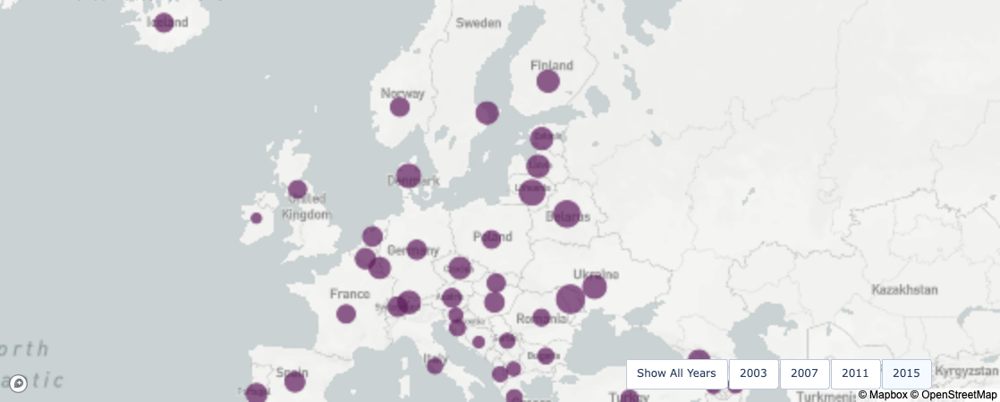

In [27]:
import plotly.graph_objs as go

# Filter the DataFrame to include only rows where Area = 'Total'
dft = df[df['Area'] == 'Total']

# Extract latitude and longitude for plotting
site_lat = dft['latitude']
site_lon = dft['longitude']
locations_name = dft['Country']

# Create layout
layout = go.Layout(
    title='Divorce Rates by Country',
    hovermode='closest',
    showlegend=False,
    margin={'l': 0, 't': 0, 'b': 0, 'r': 0},
    mapbox=dict(
        accesstoken="pk.eyJ1Ijoia3lyYW4tZGFsZSIsImEiOiJjanZkbWE0cjkwNjkxNDBwYW0xb3p4MmtqIn0.WP9fQgGMgu8_nmMxJwFsbg",  
        zoom=0.7,
        style='light'
    ),
    width=875, height=450
)

fig = go.Figure(layout=layout)

# Define the years you want to display
years = [2003, 2007, 2011,2015]
colors = ['#FAD02E', '#F28D35', '#D83367', '#5E1A5C']

# Create a list of buttons for each year
buttons = []

# Add "Show All" button to make all markers visible
buttons.append(
    dict(
        label="Show All Years",
        method="update",
        args=[{"visible": [True] * len(years)}, {"title": "Divorce Rates by Country"}]
    )
)

# Create traces for each year
for i, year in enumerate(years):
    df_filtered = dft[dft['Year'] == year]
    fig.add_trace(
    go.Scattermapbox(
        name=str(year),
        lat=df_filtered['latitude'],
        lon=df_filtered['longitude'],
        mode='markers',
        marker=dict(
            size=df_filtered['Divorce Rate'] * 15,  # Adjust size by divorce rate
            sizeref=dft['Divorce Rate'].max() / 10 ** 2,
            sizemode='area',
            color=colors[i],
            opacity=0.7
        ),
        text=df_filtered['Country'],
        customdata=df_filtered['Year'],  # Add the year as customdata
        hovertemplate='<b>%{text}</b><br>Year: %{customdata}<br>Divorce Rate = %{marker.size:.2f} per 100,000 people<extra></extra>',
        visible=True if i == 0 else False  # Show the first year by default
    )
)
    # Add button for each year
    buttons.append(
        dict(
            label=str(year),
            method="update",
            args=[{"visible": [j == i for j in range(len(years))]}, {"title": f"Divorce Rates for {year}"}]
        )
    )

# Update layout with buttons
fig.layout.update(
    updatemenus=[
        dict(
            type="buttons",
            direction="right",
            x=0.93,
            y=0.11,
            showactive=True,  # Show the last clicked button
            buttons=buttons,
            active=0  # Set initial active button (default year, e.g., 2003)
        )
    ]
)

# **Only show the final graph** here
fig.show()

In [33]:
#fig.write_html('divorcesplotly.html')

In [36]:
embed_string = plot(fig, output_type='div', include_plotlyjs="cdn")

In [38]:
print(embed_string)

<div>                        <script type="text/javascript">window.PlotlyConfig = {MathJaxConfig: 'local'};</script>
        <script charset="utf-8" src="https://cdn.plot.ly/plotly-2.32.0.min.js"></script>                <div id="b99f1a63-69b4-434d-adbf-923ad34c2a88" class="plotly-graph-div" style="height:450px; width:875px;"></div>            <script type="text/javascript">                                    window.PLOTLYENV=window.PLOTLYENV || {};                                    if (document.getElementById("b99f1a63-69b4-434d-adbf-923ad34c2a88")) {                    Plotly.newPlot(                        "b99f1a63-69b4-434d-adbf-923ad34c2a88",                        [{"customdata":[2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003,2003],"hovertemplate":"\u003cb\u003e%{text}\u003c\u002fb\u003e\u003cbr\u003eYear: %{customdata}\u0

** We realized that beyond absolute divorce counts, it's crucial to understand the proportion of divorces relative to marriages.**

In [14]:
df_total = df[df['Area'] == 'Total'].copy()

# Compute Divorce-to-Marriage Ratio
df_total['Divorce_to_Marriage_Ratio'] = df_total['Divorces'] / df_total['Marriages']

# Preview updated DataFrame
df_total[['Country', 'Year', 'Divorces', 'Marriages', 'Divorce_to_Marriage_Ratio']].head()


,Country,Year,Divorces,Marriages,Divorce_to_Marriage_Ratio
0,Albania,2021,3113,19709.0,0.157948
1,Albania,2020,4267,17473.0,0.244205
2,Albania,2019,5860,22415.0,0.261432
3,Albania,2018,4846,23104.0,0.209747
4,Albania,2017,4508,22641.0,0.199108


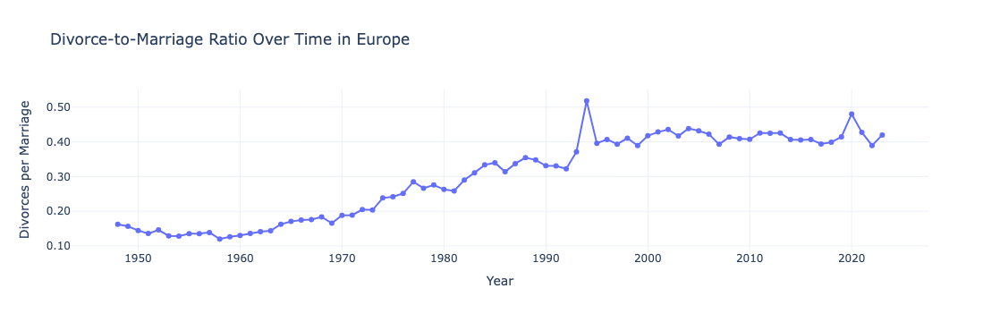

In [26]:
# Group by year to get totals across Europe
europe_yearly = df_total.groupby('Year')[['Divorces', 'Marriages']].sum().reset_index()

# Calculate ratio
europe_yearly['Divorce_to_Marriage_Ratio'] = europe_yearly['Divorces'] / europe_yearly['Marriages']

# Plot using Plotly
fig = px.line(
    europe_yearly,
    x='Year',
    y='Divorce_to_Marriage_Ratio',
    title='Divorce-to-Marriage Ratio Over Time in Europe',
    labels={'Divorce_to_Marriage_Ratio': 'Divorces per Marriage'},
    markers=True
)

fig.update_layout(
    yaxis=dict(tickformat=".2f"),
    hovermode="x unified",
    template="plotly_white"
)

fig.show()



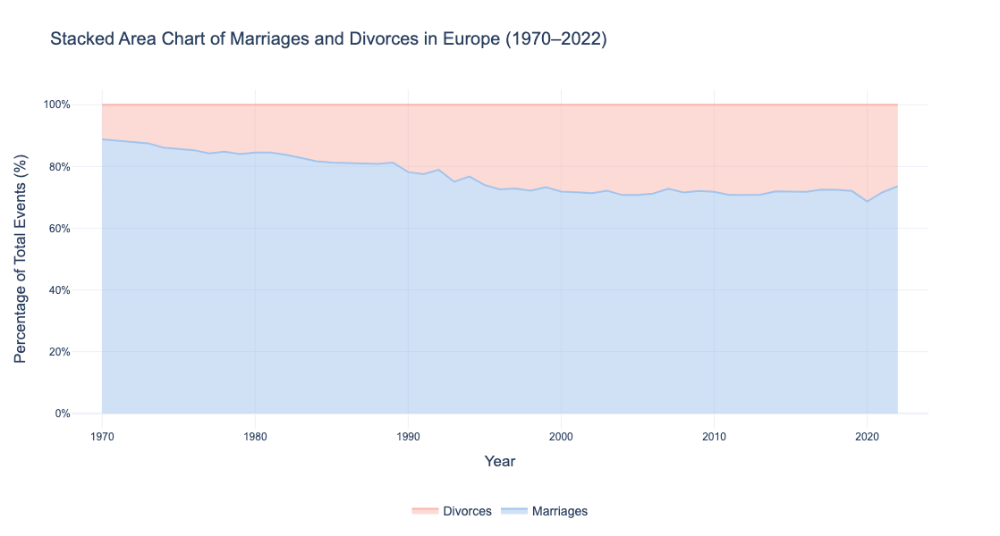

In [297]:


# Filter and clean
df_clean = df.dropna(subset=["Marriages", "Divorces", "Year"])
df_clean = df_clean[df_clean["Year"].between(1970, 2022)]

# Group by year and compute totals
df_grouped = df_clean.groupby("Year")[["Marriages", "Divorces"]].sum().reset_index()

# Normalize to percentages
total = df_grouped["Marriages"] + df_grouped["Divorces"]
df_grouped["Marriages_pct"] = df_grouped["Marriages"] / total * 100
df_grouped["Divorces_pct"] = df_grouped["Divorces"] / total * 100

# Define soft pastel colors
colors = {
    "Marriages": "#A2C4EC",  # pastel blue
    "Divorces": "#F9B5AC"    # pastel coral
}

# Create the stacked area chart
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=df_grouped["Year"],
    y=df_grouped["Marriages_pct"],
    mode="lines",
    name="Marriages",
    stackgroup="one",
    fill="tonexty",
    line=dict(color=colors["Marriages"]),
    hoverinfo="x+y"
))

fig.add_trace(go.Scatter(
    x=df_grouped["Year"],
    y=df_grouped["Divorces_pct"],
    mode="lines",
    name="Divorces",
    stackgroup="one",
    line=dict(color=colors["Divorces"]),
    hoverinfo="x+y"
))

# Layout improvements
fig.update_layout(
    title="Stacked Area Chart of Marriages and Divorces in Europe (1970–2022)",
    xaxis_title="Year",
    yaxis_title="Percentage of Total Events (%)",
    yaxis=dict(range=[-5, 105], ticksuffix="%", tickfont=dict(size=12)),
    xaxis=dict(range=[1968, 2024], tickfont=dict(size=12)),
    template="plotly_white",
    height=600,
    width=950,
    font=dict(family="Arial", size=14),
    hovermode="x unified",
    legend=dict(
        title=None,
        orientation="h",
        x=0.5,
        xanchor="center",
        y=-0.2
    )
)

fig.show()


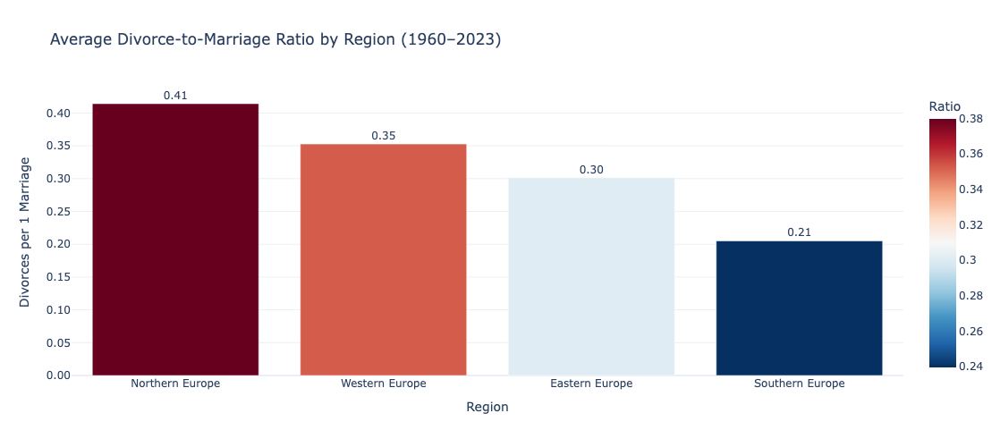

In [269]:
import plotly.express as px

# Filter to Total area only
region_df = df[df["Area"] == "Total"]

# Group and compute average ratio
avg_ratio_by_region = region_df.groupby("Region")["Divorce_to_Marriage_Ratio"].mean().reset_index()

# Sort values
avg_ratio_by_region = avg_ratio_by_region.sort_values("Divorce_to_Marriage_Ratio", ascending=False)

# Create a bar chart with built-in red-to-blue color scale
fig = px.bar(
    avg_ratio_by_region,
    x="Region",
    y="Divorce_to_Marriage_Ratio",
    text="Divorce_to_Marriage_Ratio",
    color="Divorce_to_Marriage_Ratio",
    color_continuous_scale="rdbu_r",  # Built-in red-to-blue color scale
    labels={"Divorce_to_Marriage_Ratio": "Divorces per Marriage"},
    title="Average Divorce-to-Marriage Ratio by Region (1960–2023)",
    template="plotly_white"
)

# Style the chart
fig.update_traces(texttemplate="%{text:.2f}", textposition="outside")
fig.update_layout(
    xaxis_title="Region",
    yaxis_title="Divorces per 1 Marriage",
    yaxis=dict(tickformat=".2f"),
    coloraxis_colorbar_title="Ratio",
    showlegend=False,
    height=500,
    coloraxis=dict(
        cmin=0.24,  # Adjust to remove unwanted portions of the scale
        cmax=0.38,  # Adjust to remove unwanted portions of the scale
        colorbar=dict(title="Ratio")
    )
)
fig.show()




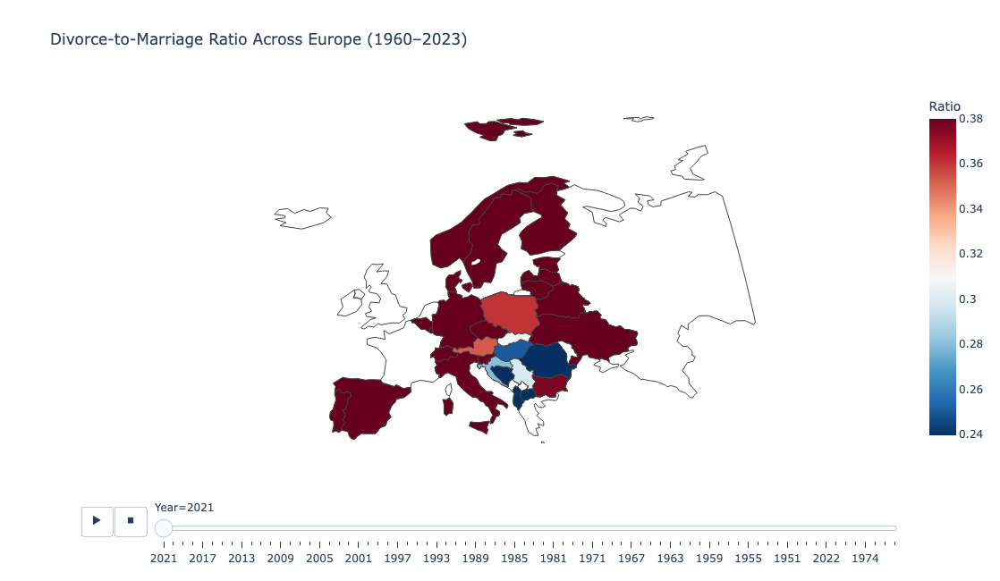

In [418]:
import plotly.express as px
import pandas as pd

# Load your data
df = pd.read_csv("Merged_Data_Divorce.csv")

# Create Divorce-to-Marriage Ratio column (if not already in dataset)
df["Divorce_to_Marriage_Ratio"] = df["Divorces"] / df["Marriages"]

# Optional: filter to only total area if there's a breakdown
if "Area" in df.columns:
    df = df[df["Area"] == "Total"]

# Build the choropleth
fig = px.choropleth(
    df,
    locations="Country",
    locationmode="country names",
    color="Divorce_to_Marriage_Ratio",
    hover_name="Country",
    animation_frame="Year",
    color_continuous_scale=px.colors.diverging.RdBu_r,
    range_color=(0.24, 0.38),
    title="Divorce-to-Marriage Ratio Across Europe (1960–2023)"
)

fig.update_geos(
    scope="europe",
    projection_type="natural earth",
    showcoastlines=True,
    showland=True,
    landcolor="white",
    lataxis_range=[35, 72],
    lonaxis_range=[-25, 45],
    fitbounds="locations"
)

# Layout adjustments
fig.update_layout(
    coloraxis=dict(colorbar=dict(title="Ratio")),
    geo=dict(showframe=False, showcoastlines=False),
    template="plotly_white",
    height=650,
    width=950
)

fig.show()




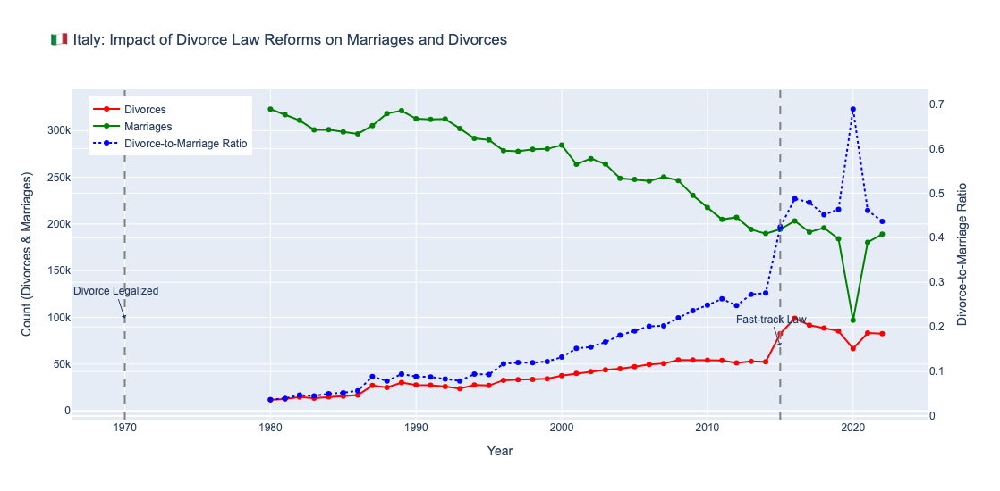

In [303]:
italy_df = df[df["Country"] == "Italy"].copy()
italy_df["Divorce_to_Marriage_Ratio"] = italy_df["Divorces"] / italy_df["Marriages"]
import plotly.graph_objects as go

fig = go.Figure()

# Plot Divorces
fig.add_trace(go.Scatter(
    x=italy_df["Year"], y=italy_df["Divorces"],
    mode="lines+markers", name="Divorces",
    line=dict(color="red")
))

# Plot Marriages
fig.add_trace(go.Scatter(
    x=italy_df["Year"], y=italy_df["Marriages"],
    mode="lines+markers", name="Marriages",
    line=dict(color="green")
))

# Plot Ratio
fig.add_trace(go.Scatter(
    x=italy_df["Year"], y=italy_df["Divorce_to_Marriage_Ratio"],
    mode="lines+markers", name="Divorce-to-Marriage Ratio",
    line=dict(color="blue", dash="dot"),
    yaxis="y2"
))

# Layout: Dual y-axis
fig.update_layout(
    title="🇮🇹 Italy: Impact of Divorce Law Reforms on Marriages and Divorces",
    xaxis_title="Year",
    yaxis=dict(title="Count (Divorces & Marriages)", side="left"),
    yaxis2=dict(title="Divorce-to-Marriage Ratio", overlaying="y", side="right"),
    legend=dict(x=0.02, y=0.98),
    height=550,
    font=dict(family="Arial", size=12)
)

# Annotations for reforms
fig.add_vline(x=1970, line_dash="dash", line_color="gray")
fig.add_annotation(x=1970, y=max(italy_df["Divorces"]), text="Divorce Legalized", showarrow=True, arrowhead=1)

fig.add_vline(x=2015, line_dash="dash", line_color="gray")
fig.add_annotation(x=2015, y=max(italy_df["Divorces"])*0.7, text="Fast-track Law", showarrow=True, arrowhead=1)

fig.show()


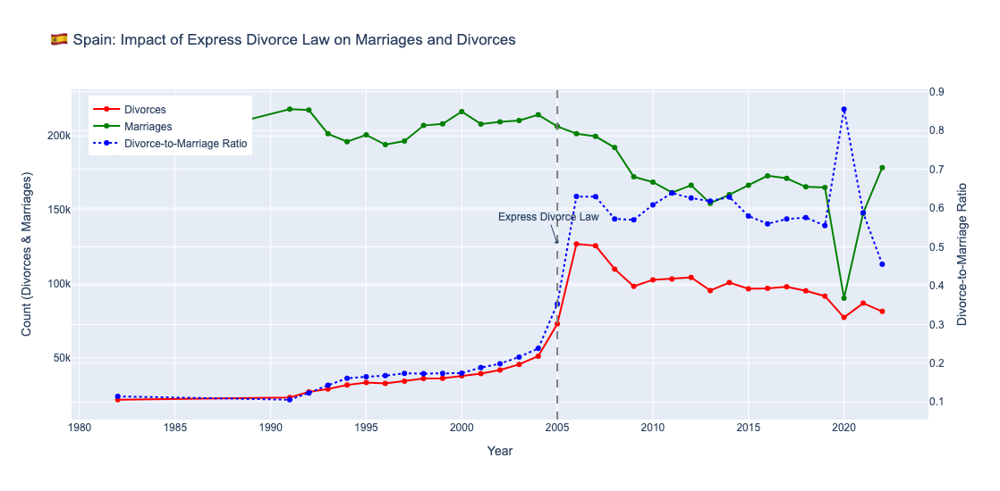

In [305]:
spain_df = df[df["Country"] == "Spain"].copy()
spain_df["Divorce_to_Marriage_Ratio"] = spain_df["Divorces"] / spain_df["Marriages"]

fig = go.Figure()

fig.add_trace(go.Scatter(x=spain_df["Year"], y=spain_df["Divorces"], name="Divorces", mode="lines+markers", line=dict(color="red")))
fig.add_trace(go.Scatter(x=spain_df["Year"], y=spain_df["Marriages"], name="Marriages", mode="lines+markers", line=dict(color="green")))
fig.add_trace(go.Scatter(x=spain_df["Year"], y=spain_df["Divorce_to_Marriage_Ratio"], name="Divorce-to-Marriage Ratio", mode="lines+markers", line=dict(color="blue", dash="dot"), yaxis="y2"))

fig.update_layout(
    title="🇪🇸 Spain: Impact of Express Divorce Law on Marriages and Divorces",
    xaxis_title="Year",
    yaxis=dict(title="Count (Divorces & Marriages)", side="left"),
    yaxis2=dict(title="Divorce-to-Marriage Ratio", overlaying="y", side="right"),
    legend=dict(x=0.02, y=0.98),
    height=550,
    font=dict(family="Arial", size=12)
)

fig.add_vline(x=2005, line_dash="dash", line_color="gray")
fig.add_annotation(x=2005, y=max(spain_df["Divorces"]), text="Express Divorce Law", showarrow=True, arrowhead=1)

fig.show()


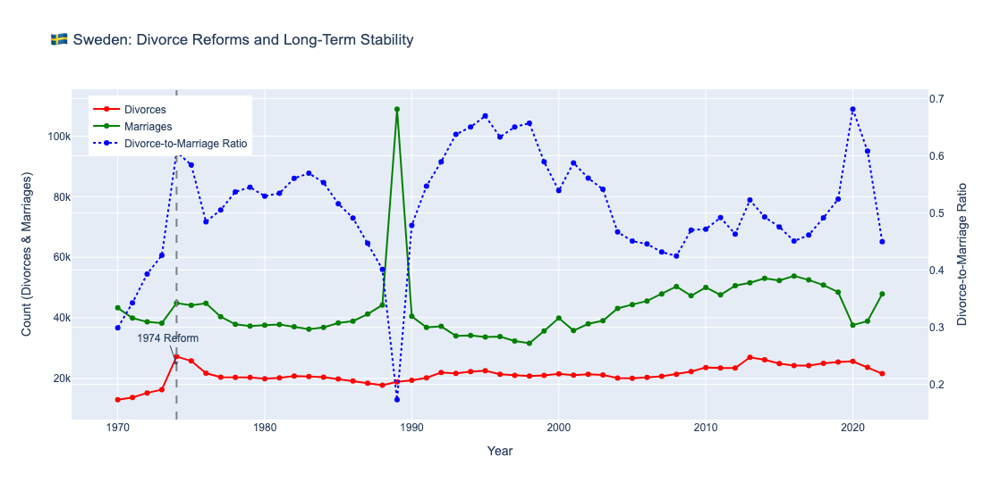

In [307]:
sweden_df = df[df["Country"] == "Sweden"].copy()
sweden_df["Divorce_to_Marriage_Ratio"] = sweden_df["Divorces"] / sweden_df["Marriages"]

fig = go.Figure()

fig.add_trace(go.Scatter(x=sweden_df["Year"], y=sweden_df["Divorces"], name="Divorces", mode="lines+markers", line=dict(color="red")))
fig.add_trace(go.Scatter(x=sweden_df["Year"], y=sweden_df["Marriages"], name="Marriages", mode="lines+markers", line=dict(color="green")))
fig.add_trace(go.Scatter(x=sweden_df["Year"], y=sweden_df["Divorce_to_Marriage_Ratio"], name="Divorce-to-Marriage Ratio", mode="lines+markers", line=dict(color="blue", dash="dot"), yaxis="y2"))

fig.update_layout(
    title="🇸🇪 Sweden: Divorce Reforms and Long-Term Stability",
    xaxis_title="Year",
    yaxis=dict(title="Count (Divorces & Marriages)", side="left"),
    yaxis2=dict(title="Divorce-to-Marriage Ratio", overlaying="y", side="right"),
    legend=dict(x=0.02, y=0.98),
    height=550,
    font=dict(family="Arial", size=12)
)

# Add 1974 reform line
fig.add_vline(x=1974, line_dash="dash", line_color="gray")
fig.add_annotation(x=1974, y=max(sweden_df["Divorces"])*0.9, text="1974 Reform", showarrow=True, arrowhead=1)

fig.show()


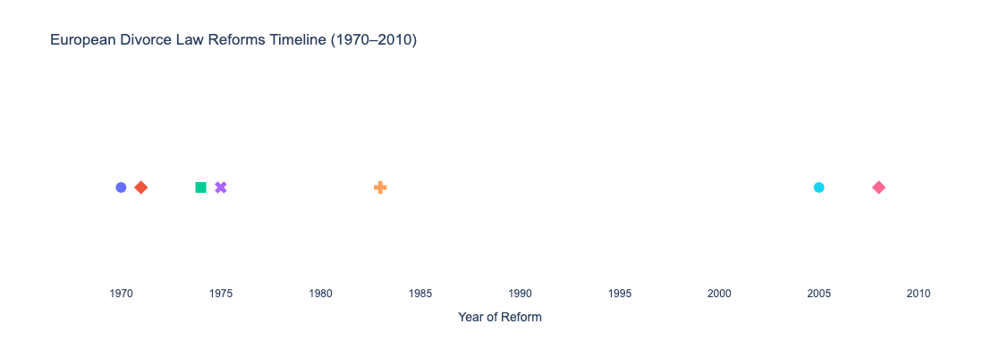

In [315]:
import plotly.express as px
import pandas as pd

# Reform dataset
reform_data = pd.DataFrame({
    "Country": ["Sweden", "UK", "France", "Italy", "Spain", "Portugal", "Greece"],
    "Year": [1974, 1971, 1975, 1970, 2005, 2008, 1983],
    "Event": [
        "No-fault & no wait",
        "Separation allowed (Reform Act)",
        "No-fault legalized",
        "Divorce legalized",
        "Express Divorce Law",
        "Mutual Consent Divorce Reform",
        "Family Law Modernization"
    ]
})

# Sort and create hover label only (no text on graph)
reform_data = reform_data.sort_values("Year")

fig = px.scatter(
    reform_data,
    x="Year",
    y=[""] * len(reform_data),
    color="Country",
    symbol="Country",
    hover_name="Country",
    hover_data={"Year": True, "Event": True},
    labels={"y": "", "Year": "Year of Reform"},
    title="European Divorce Law Reforms Timeline (1970–2010)"
)

fig.update_traces(marker=dict(size=12), textposition="top center")
fig.update_layout(
    yaxis=dict(showticklabels=False, showgrid=False, zeroline=False),
    xaxis=dict(dtick=5),
    showlegend=False,
    height=400,
    font=dict(family="Arial", size=12),
    plot_bgcolor="white"
)

fig.show()



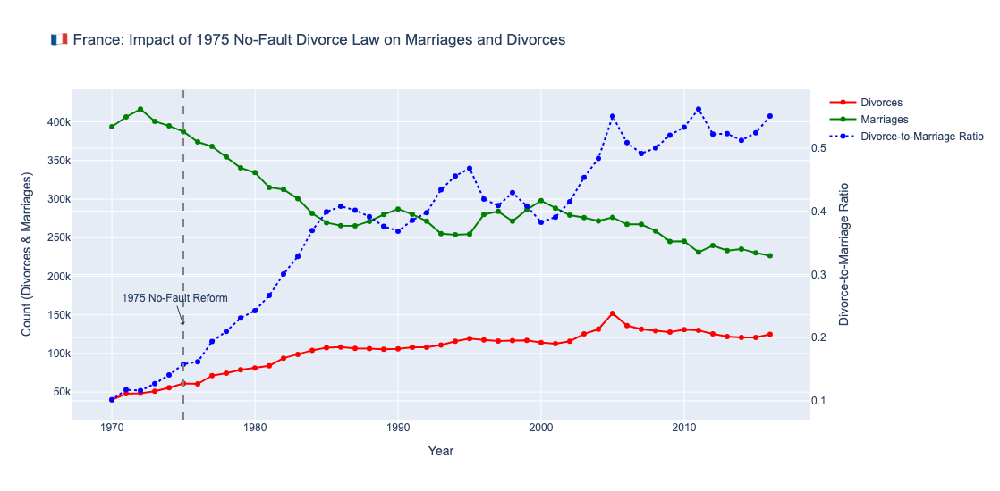

In [317]:
france_df = df[df["Country"] == "France"].copy()
france_df["Divorce_to_Marriage_Ratio"] = france_df["Divorces"] / france_df["Marriages"]

fig = go.Figure()
fig.add_trace(go.Scatter(x=france_df["Year"], y=france_df["Divorces"], name="Divorces", mode="lines+markers", line=dict(color="red")))
fig.add_trace(go.Scatter(x=france_df["Year"], y=france_df["Marriages"], name="Marriages", mode="lines+markers", line=dict(color="green")))
fig.add_trace(go.Scatter(x=france_df["Year"], y=france_df["Divorce_to_Marriage_Ratio"], name="Divorce-to-Marriage Ratio", mode="lines+markers", line=dict(color="blue", dash="dot"), yaxis="y2"))

fig.update_layout(
    title="🇫🇷 France: Impact of 1975 No-Fault Divorce Law on Marriages and Divorces",
    xaxis_title="Year",
    yaxis=dict(title="Count (Divorces & Marriages)", side="left"),
    yaxis2=dict(title="Divorce-to-Marriage Ratio", overlaying="y", side="right"),
    height=550,
    font=dict(family="Arial", size=12)
)

fig.add_vline(x=1975, line_dash="dash", line_color="gray")
fig.add_annotation(x=1975, y=max(france_df["Divorces"])*0.9, text="1975 No-Fault Reform", showarrow=True, arrowhead=1)

fig.show()


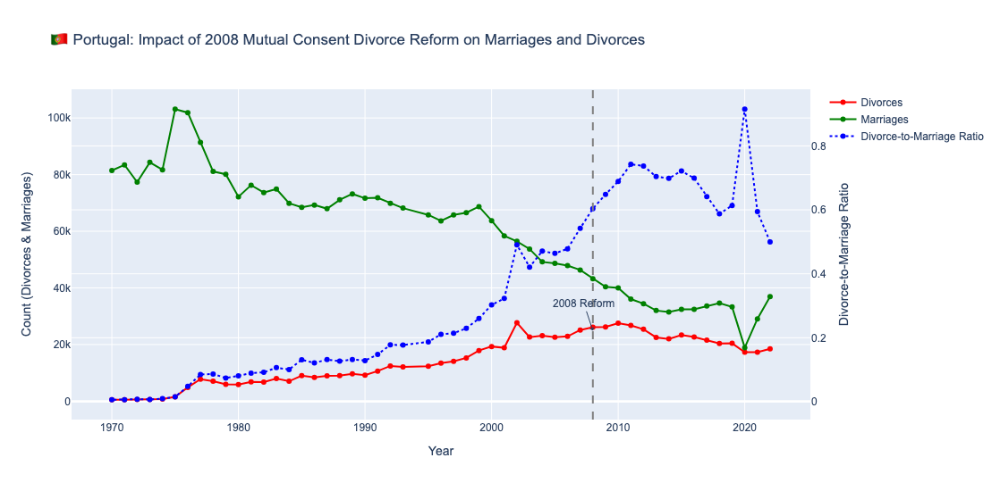

In [319]:
portugal_df = df[df["Country"] == "Portugal"].copy()
portugal_df["Divorce_to_Marriage_Ratio"] = portugal_df["Divorces"] / portugal_df["Marriages"]

fig = go.Figure()
fig.add_trace(go.Scatter(x=portugal_df["Year"], y=portugal_df["Divorces"], name="Divorces", mode="lines+markers", line=dict(color="red")))
fig.add_trace(go.Scatter(x=portugal_df["Year"], y=portugal_df["Marriages"], name="Marriages", mode="lines+markers", line=dict(color="green")))
fig.add_trace(go.Scatter(x=portugal_df["Year"], y=portugal_df["Divorce_to_Marriage_Ratio"], name="Divorce-to-Marriage Ratio", mode="lines+markers", line=dict(color="blue", dash="dot"), yaxis="y2"))

fig.update_layout(
    title="🇵🇹 Portugal: Impact of 2008 Mutual Consent Divorce Reform on Marriages and Divorces",
    xaxis_title="Year",
    yaxis=dict(title="Count (Divorces & Marriages)", side="left"),
    yaxis2=dict(title="Divorce-to-Marriage Ratio", overlaying="y", side="right"),
    height=550,
    font=dict(family="Arial", size=12)
)

fig.add_vline(x=2008, line_dash="dash", line_color="gray")
fig.add_annotation(x=2008, y=max(portugal_df["Divorces"])*0.9, text="2008 Reform", showarrow=True, arrowhead=1)

fig.show()


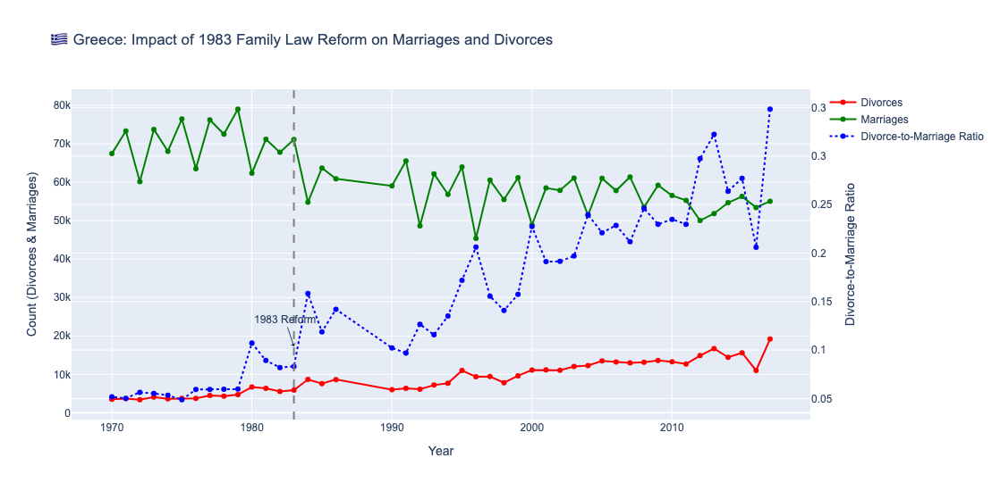

In [321]:
greece_df = df[df["Country"] == "Greece"].copy()
greece_df["Divorce_to_Marriage_Ratio"] = greece_df["Divorces"] / greece_df["Marriages"]

fig = go.Figure()
fig.add_trace(go.Scatter(x=greece_df["Year"], y=greece_df["Divorces"], name="Divorces", mode="lines+markers", line=dict(color="red")))
fig.add_trace(go.Scatter(x=greece_df["Year"], y=greece_df["Marriages"], name="Marriages", mode="lines+markers", line=dict(color="green")))
fig.add_trace(go.Scatter(x=greece_df["Year"], y=greece_df["Divorce_to_Marriage_Ratio"], name="Divorce-to-Marriage Ratio", mode="lines+markers", line=dict(color="blue", dash="dot"), yaxis="y2"))

fig.update_layout(
    title="🇬🇷 Greece: Impact of 1983 Family Law Reform on Marriages and Divorces",
    xaxis_title="Year",
    yaxis=dict(title="Count (Divorces & Marriages)", side="left"),
    yaxis2=dict(title="Divorce-to-Marriage Ratio", overlaying="y", side="right"),
    height=550,
    font=dict(family="Arial", size=12)
)

fig.add_vline(x=1983, line_dash="dash", line_color="gray")
fig.add_annotation(x=1983, y=max(greece_df["Divorces"])*0.9, text="1983 Reform", showarrow=True, arrowhead=1)

fig.show()


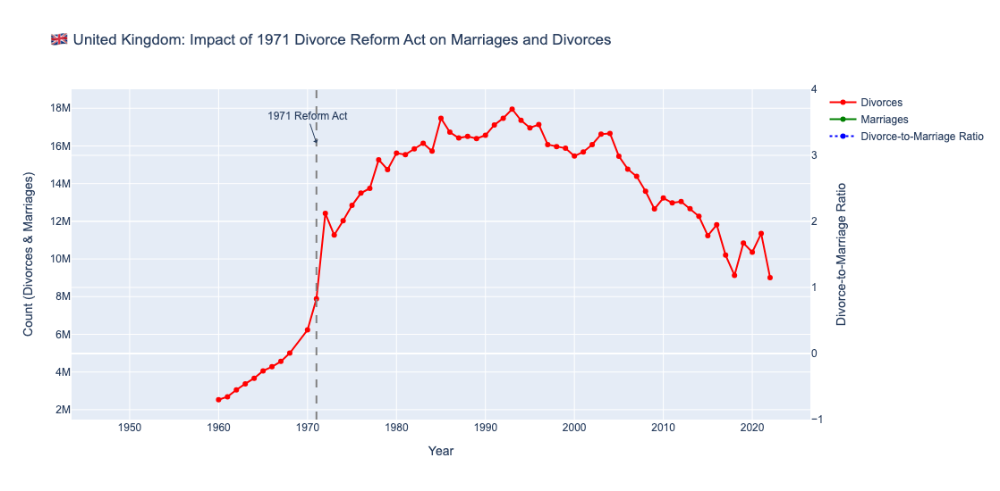

In [349]:
uk_df = df[(df["Country"] == "United Kingdom")].copy()  # Remove Area filter for now


# Reconstruct divorces if needed
uk_df["Divorces"] = uk_df["Divorce Rate"] * uk_df["Population"] / 1000  # Divorce Rate is per 1000
uk_df["Divorce_to_Marriage_Ratio"] = uk_df["Divorces"] / uk_df["Marriages"]

fig = go.Figure()
fig.add_trace(go.Scatter(x=uk_df["Year"], y=uk_df["Divorces"], name="Divorces", mode="lines+markers", line=dict(color="red")))
fig.add_trace(go.Scatter(x=uk_df["Year"], y=uk_df["Marriages"], name="Marriages", mode="lines+markers", line=dict(color="green")))
fig.add_trace(go.Scatter(x=uk_df["Year"], y=uk_df["Divorce_to_Marriage_Ratio"], name="Divorce-to-Marriage Ratio", mode="lines+markers", line=dict(color="blue", dash="dot"), yaxis="y2"))

fig.update_layout(
    title="🇬🇧 United Kingdom: Impact of 1971 Divorce Reform Act on Marriages and Divorces",
    xaxis_title="Year",
    yaxis=dict(title="Count (Divorces & Marriages)", side="left"),
    yaxis2=dict(title="Divorce-to-Marriage Ratio", overlaying="y", side="right"),
    height=550,
    font=dict(family="Arial", size=12)
)

if not uk_df["Divorces"].dropna().empty:
    fig.add_vline(x=1971, line_dash="dash", line_color="gray")
    fig.add_annotation(x=1971, y=uk_df["Divorces"].dropna().max() * 0.9, text="1971 Reform Act", showarrow=True, arrowhead=1)

fig.show()




In [343]:
df[(df["Country"] == "United Kingdom") & (df["Area"] == "Total")][["Year", "Divorce Rate", "Population", "Marriages"]]


,Year,Divorce Rate,Population,Marriages


PREDICTION

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.



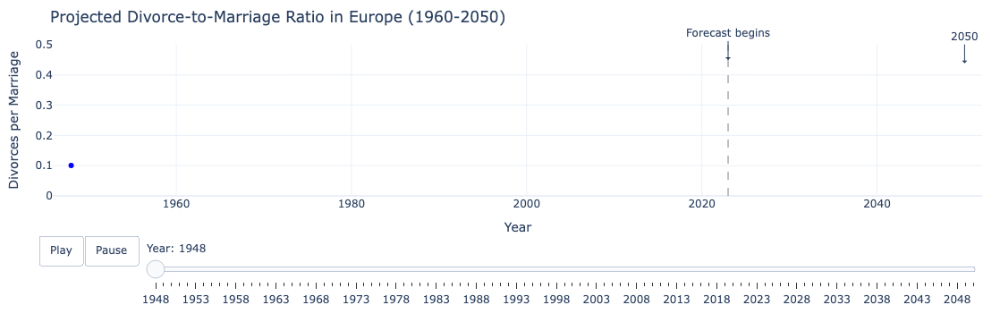

In [416]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from statsmodels.tsa.arima.model import ARIMA

# Load & clean data
df = pd.read_csv("Merged_Data_Divorce.csv")
df = df[df["Area"] == "Total"]
df["Divorce_to_Marriage_Ratio"] = df["Divorces"] / df["Marriages"]
df = df.dropna(subset=["Divorce_to_Marriage_Ratio", "Year"])

# Group by year
yearly = df.groupby("Year")["Divorce_to_Marriage_Ratio"].mean().reset_index()
yearly["Year"] = yearly["Year"].astype(int)

# Fit ARIMA model
model = ARIMA(yearly[["Year", "Divorce_to_Marriage_Ratio"]].set_index("Year"), order=(2, 1, 2))
fitted = model.fit()

# Generate forecast to 2050
last_year = yearly["Year"].max()
forecast_steps = 2050 - last_year  # Calculate steps needed to reach 2050
forecast_years = np.arange(last_year + 1, 2051)  # Go up to 2050
forecast = fitted.get_forecast(steps=forecast_steps)
forecast_mean = forecast.predicted_mean.values
conf_int = forecast.conf_int()

# Create animation data
# Add a column to track the animation frame for each year
yearly["frame"] = yearly.index
yearly["type"] = "Historical"

# Create forecast dataframe with same structure
forecast_df = pd.DataFrame({
    "Year": forecast_years,
    "Divorce_to_Marriage_Ratio": forecast_mean,
    "frame": range(len(yearly), len(yearly) + len(forecast_years)),
    "type": "Forecast"
})

# Combine both dataframes
all_data = pd.concat([yearly, forecast_df])

# Create figure
fig = go.Figure()

# Add empty traces that will be filled during animation
fig.add_trace(
    go.Scatter(
        x=[yearly["Year"].min()],
        y=[yearly["Divorce_to_Marriage_Ratio"].iloc[0]],
        mode="lines+markers",
        name="Historical Data",
        line=dict(color="blue", width=2)
    )
)

fig.add_trace(
    go.Scatter(
        x=[],
        y=[],
        mode="lines+markers",
        name="ARIMA Forecast",
        line=dict(color="orange", width=2, dash="dash")
    )
)

# Create frames - one for each year
frames = []
for i in range(len(all_data)):
    # Get data up to this frame
    current_frame = all_data[all_data["frame"] <= i]
    historical = current_frame[current_frame["type"] == "Historical"]
    forecast = current_frame[current_frame["type"] == "Forecast"]
    
    frame = go.Frame(
        data=[
            # Update historical line
            go.Scatter(
                x=historical["Year"],
                y=historical["Divorce_to_Marriage_Ratio"],
                mode="lines+markers",
                line=dict(color="blue", width=2)
            ),
            # Update forecast line
            go.Scatter(
                x=forecast["Year"],
                y=forecast["Divorce_to_Marriage_Ratio"],
                mode="lines+markers",
                line=dict(color="orange", width=2, dash="dash")
            )
        ],
        name=str(i)
    )
    frames.append(frame)

# Add frames to figure
fig.frames = frames

# Layout
fig.update_layout(
    # Updated title with correct year range
    title="Projected Divorce-to-Marriage Ratio in Europe (1960-2050)",
    
    # Fixed axis ranges
    xaxis=dict(range=[yearly["Year"].min() - 2, 2052], title="Year"),
    yaxis=dict(
        range=[0, 0.5],  # Set a fixed range with good headroom
        dtick=0.1,       # Set tick interval to 0.1
        title="Divorces per Marriage"
    ),
    
    # Improved button positioning
    updatemenus=[{
        "type": "buttons",
        "buttons": [
            {
                "label": "Play",
                "method": "animate",
                "args": [None, {"frame": {"duration": 200}, "fromcurrent": True, "transition": {"duration": 0}}]
            },
            {
                "label": "Pause",
                "method": "animate",
                "args": [[None], {"frame": {"duration": 0}, "mode": "immediate"}]
            }
        ],
        "direction": "left",
        "pad": {"r": 10, "t": 10},
        "showactive": False,
        "x": 0.1,
        "y": -0.2,  # Move buttons down to avoid overlap
        "xanchor": "right",
        "yanchor": "top"
    }],
    
    # Increase bottom margin to make room for controls
    margin=dict(b=100, l=60, r=20, t=50),
    template="plotly_white",
    
    # Add a vertical line marking transition from historical to forecast
    shapes=[
        dict(
            type="line",
            x0=last_year,
            y0=0,
            x1=last_year,
            y1=0.5,
            line=dict(color="gray", width=1, dash="dash")
        )
    ],
    
    # Add annotation to mark forecast beginning
    annotations=[
        dict(
            x=last_year,
            y=0.45,
            xref="x",
            yref="y",
            text="Forecast begins",
            showarrow=True,
            arrowhead=1,
            ax=0,
            ay=-30
        ),
        dict(
            x=2050,
            y=forecast_mean[-1],
            text="2050",
            showarrow=True,
            arrowhead=1,
            ax=0,
            ay=-30
        )   
    ]
)

# Improved slider positioning
sliders = [{
    "active": 0,
    "steps": [{"args": [[str(i)], {"frame": {"duration": 0, "redraw": True}, "mode": "immediate"}],
               "label": str(year), "method": "animate"} 
              for i, year in enumerate(all_data["Year"])],
    "x": 0.1,
    "y": -0.1,  # Move slider up from buttons
    "currentvalue": {"visible": True, "prefix": "Year: "},
    "len": 0.9,
    "pad": {"b": 10, "t": 30}
}]
fig.update_layout(sliders=sliders)

fig.show()

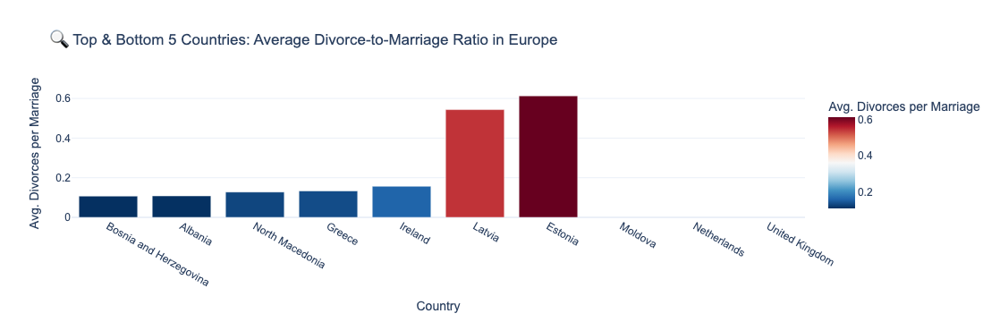

In [420]:
import pandas as pd
import plotly.express as px

# Load data
df = pd.read_csv("Merged_Data_Divorce.csv")
df = df[df["Area"] == "Total"]
df["Divorce_to_Marriage_Ratio"] = df["Divorces"] / df["Marriages"]

# Average divorce-to-marriage ratio by country
avg_ratio = df.groupby("Country")["Divorce_to_Marriage_Ratio"].mean().sort_values()

# Prepare top & bottom 5
top5 = avg_ratio.tail(5)
bottom5 = avg_ratio.head(5)
highlight_df = pd.concat([bottom5, top5]).reset_index()

# Plot
fig = px.bar(
    highlight_df,
    x="Country",
    y="Divorce_to_Marriage_Ratio",
    color="Divorce_to_Marriage_Ratio",
    color_continuous_scale="rdbu_r",
    title="🔍 Top & Bottom 5 Countries: Average Divorce-to-Marriage Ratio in Europe",
    labels={"Divorce_to_Marriage_Ratio": "Avg. Divorces per Marriage"},
)

fig.update_layout(template="plotly_white", font=dict(family="Arial", size=12))
fig.show()


some cleaning or miscalculation is causing 0 rows...

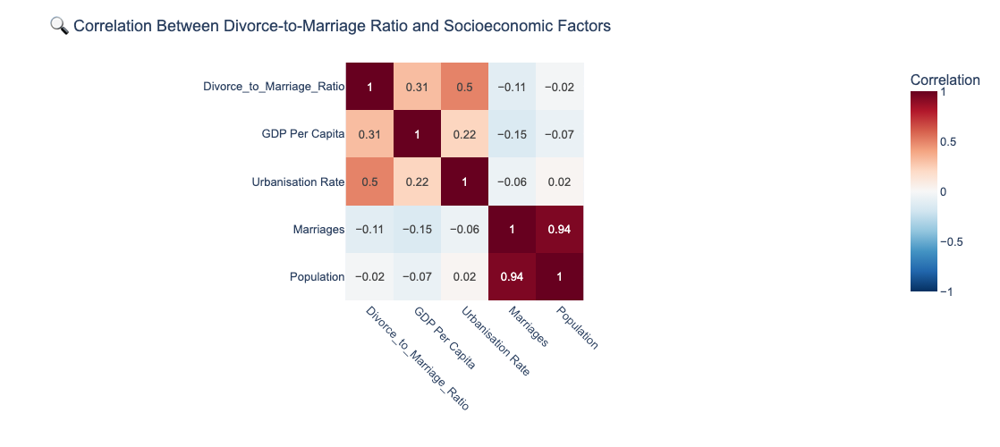

In [432]:
import pandas as pd
import plotly.express as px

# Load and prep data
df = pd.read_csv("Merged_Data_Divorce.csv")
df = df[df["Area"] == "Total"]
df["Divorce_to_Marriage_Ratio"] = df["Divorces"] / df["Marriages"]

# Subset and clean
features = [
    "Divorce_to_Marriage_Ratio",
    "GDP Per Capita",
    "Urbanisation Rate",
    "Marriages",
    "Population"
]
corr_df = df[features].dropna()
correlation = corr_df.corr().round(2)

# Heatmap with better style
fig = px.imshow(
    correlation,
    text_auto=True,
    color_continuous_scale="rdbu_r",
    zmin=-1, zmax=1,
    labels=dict(color="Correlation"),
    title="🔍 Correlation Between Divorce-to-Marriage Ratio and Socioeconomic Factors"
)

# Style update
fig.update_layout(
    font=dict(family="Arial", size=13),
    title_font=dict(size=18),
    width=700,
    height=500,
    margin=dict(l=50, r=50, t=70, b=50),
    xaxis_title="",
    yaxis_title="",
    xaxis=dict(tickangle=45)
)

fig.show()



### Data Wrapper Charts

## Conclusion <a class="anchor" id="conclusion"></a>